In [1]:
import numpy as np 
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import mean_absolute_error
from sklearn.model_selection import train_test_split #分割訓練/測試資料集
from sklearn import preprocessing
from tqdm import tqdm #進度條
import time
import datetime
import xlrd
import pylab as pl
from scipy import stats

%matplotlib inline

import warnings 
warnings.filterwarnings("ignore")

In [2]:
#讀取資料
A75F_1 = pd.read_csv("A75F_no_continuous(b10).csv",encoding = 'big5')
# 將ds_quality_code分類
# # LabelEncoder
# quality_code = LabelEncoder()
# quality_code.fit(A75F_1['ds_quality_code'].unique())
# A75F_1['ds_quality_code'] = quality_code.transform(A75F_1['ds_quality_code'])
# A75F = A75F_1.drop(['Unnamed: 0','sgf'],axis=1)

# One Hot encoding
#將'RRQ','BP'作One Hot encoding
x1 = pd.get_dummies(A75F_1['ds_quality_code'])
x1.columns = ['RRQ','BP']
A75F_1.drop('ds_quality_code',axis=1,inplace=True)
A75F_1 = pd.concat([A75F_1,x1],axis=1)

#將'Unnamed: 0','sgf'欄位刪除
A75F = A75F_1.drop(['Unnamed: 0','sgf'],axis=1)
print(A75F.shape)
A75F.columns[A75F.isnull().any()] #檢查有缺失值的欄位

(186613, 135)


Index(['LP1 MAN SUCC OFFSET from HMI G300', 'LP1 Touch Angle',
       'LP2 MAN SUCC OFFSET from HMI G300', 'LP2 Touch Angle',
       'LP3 MAN SUCC OFFSET from HMI G300', 'LP3 Touch Angle',
       'LP4 MAN SUCC OFFSET from HMI G300', 'LP4 Touch Angle',
       'LP5 MAN SUCC OFFSET from HMI G300', 'LP5 Touch Angle',
       'LP6 MAN SUCC OFFSET from HMI G300', 'LP6 Touch Angle'],
      dtype='object')

In [3]:
#LP1~LP6 MAN SUCC OFFSET from HMI G300缺失值補 0
A75F['LP1 MAN SUCC OFFSET from HMI G300'].fillna(0,inplace=True)
A75F['LP2 MAN SUCC OFFSET from HMI G300'].fillna(0,inplace=True)
A75F['LP3 MAN SUCC OFFSET from HMI G300'].fillna(0,inplace=True)
A75F['LP4 MAN SUCC OFFSET from HMI G300'].fillna(0,inplace=True)
A75F['LP5 MAN SUCC OFFSET from HMI G300'].fillna(0,inplace=True)
A75F['LP6 MAN SUCC OFFSET from HMI G300'].fillna(0,inplace=True)

In [4]:
A75Fdropna = A75F.dropna() #將有缺失值的列刪除
print(A75Fdropna.shape)

(42438, 135)


In [5]:
A75Fdropna.head()

,coilno,fmtargetthickwhqh,fmtargetwidthwhqh,targetft,targetct,ds_yield_stress,ds_tensile_strength,ds_C,ds_Si,ds_Mn,...,Stand Rolling Torque\[7],Stand Threading Speed\[1],Stand Threading Speed\[2],Stand Threading Speed\[3],Stand Threading Speed\[4],Stand Threading Speed\[5],Stand Threading Speed\[6],Stand Threading Speed\[7],RRQ,BP
24,3024302,3.10,1005,830,630,33,46,0.15,0.00,0.76,...,115.493095,1.265958,2.137882,3.320468,4.666286,6.393353,8.274822,9.755672,0,1
25,3024303,3.50,822,880,650,25,35,0.04,0.01,0.22,...,95.749535,1.439992,2.148326,3.124285,4.289524,5.888672,7.854133,9.675254,0,1
26,3024304,3.05,749,875,640,30,45,0.13,0.01,0.70,...,84.667961,1.317273,2.100103,3.179569,4.562194,6.545115,8.899476,10.687410,0,1
27,3024305,3.05,749,875,640,30,45,0.13,0.01,0.70,...,80.770699,1.381480,2.273640,3.428508,4.847545,6.750312,8.871004,10.671510,0,1
28,3024306,3.05,749,875,640,30,45,0.13,0.01,0.70,...,79.358383,1.361997,2.247846,3.387213,4.800190,6.687339,8.927805,10.689619,0,1


In [6]:
#將A75F放到最前面的欄位
a75f = A75Fdropna['A75F']
A75Fdropna.drop(labels=['A75F'], axis=1,inplace = True)
A75Fdropna.insert(0, 'A75F', a75f)
A75Fdropna.head()

,A75F,coilno,fmtargetthickwhqh,fmtargetwidthwhqh,targetft,targetct,ds_yield_stress,ds_tensile_strength,ds_C,ds_Si,...,Stand Rolling Torque\[7],Stand Threading Speed\[1],Stand Threading Speed\[2],Stand Threading Speed\[3],Stand Threading Speed\[4],Stand Threading Speed\[5],Stand Threading Speed\[6],Stand Threading Speed\[7],RRQ,BP
24,0,3024302,3.10,1005,830,630,33,46,0.15,0.00,...,115.493095,1.265958,2.137882,3.320468,4.666286,6.393353,8.274822,9.755672,0,1
25,0,3024303,3.50,822,880,650,25,35,0.04,0.01,...,95.749535,1.439992,2.148326,3.124285,4.289524,5.888672,7.854133,9.675254,0,1
26,0,3024304,3.05,749,875,640,30,45,0.13,0.01,...,84.667961,1.317273,2.100103,3.179569,4.562194,6.545115,8.899476,10.687410,0,1
27,0,3024305,3.05,749,875,640,30,45,0.13,0.01,...,80.770699,1.381480,2.273640,3.428508,4.847545,6.750312,8.871004,10.671510,0,1
28,0,3024306,3.05,749,875,640,30,45,0.13,0.01,...,79.358383,1.361997,2.247846,3.387213,4.800190,6.687339,8.927805,10.689619,0,1


In [7]:
# 是不是整欄都是同一個數值
df_unq = A75Fdropna.apply(lambda x: x.nunique())
display(df_unq)

A75F                             2
coilno                       42198
fmtargetthickwhqh              198
fmtargetwidthwhqh              590
targetft                        13
targetct                        16
ds_yield_stress                 11
ds_tensile_strength             22
ds_C                            65
ds_Si                            4
ds_Mn                           90
ds_P                            26
ds_S                            16
ds_Cu                            8
ds_Ni                            8
ds_Cr                            7
ds_Mo                           16
ds_V                             4
ds_Sn                           10
ds_Nb                           19
ds_Ti                           32
ds_Ca                           17
ds_Co                            8
ds_Al                           52
ds_B                            24
ds_N2                           73
ds_O2                            1
ds_H2                            1
ds_Pb               

In [8]:
# 刪除唯一值欄位
A75Fdropna.drop(columns=['ds_O2','ds_H2','ds_La','ds_Ce'], inplace=True)

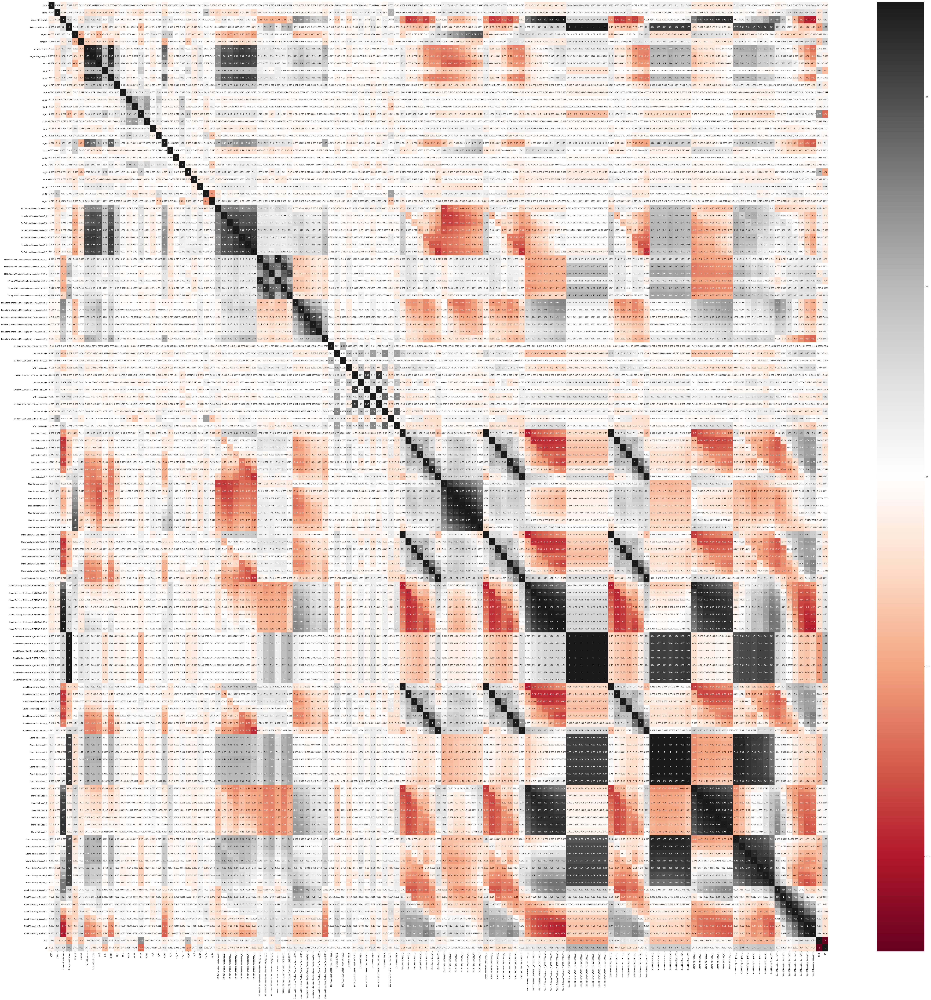

In [9]:
plt.figure(figsize=(100,100))
sns.heatmap(A75Fdropna.corr() , cmap = "RdGy",annot=True) #熱力圖

In [10]:
# A75F=0 red ; A75F=1 blue
color = {0:'r',1:'b',} 
A75Fdropna['color'] = A75Fdropna['A75F'].map(color)
A75Fdropna.head()

,A75F,coilno,fmtargetthickwhqh,fmtargetwidthwhqh,targetft,targetct,ds_yield_stress,ds_tensile_strength,ds_C,ds_Si,...,Stand Threading Speed\[1],Stand Threading Speed\[2],Stand Threading Speed\[3],Stand Threading Speed\[4],Stand Threading Speed\[5],Stand Threading Speed\[6],Stand Threading Speed\[7],RRQ,BP,color
24,0,3024302,3.10,1005,830,630,33,46,0.15,0.00,...,1.265958,2.137882,3.320468,4.666286,6.393353,8.274822,9.755672,0,1,r
25,0,3024303,3.50,822,880,650,25,35,0.04,0.01,...,1.439992,2.148326,3.124285,4.289524,5.888672,7.854133,9.675254,0,1,r
26,0,3024304,3.05,749,875,640,30,45,0.13,0.01,...,1.317273,2.100103,3.179569,4.562194,6.545115,8.899476,10.687410,0,1,r
27,0,3024305,3.05,749,875,640,30,45,0.13,0.01,...,1.381480,2.273640,3.428508,4.847545,6.750312,8.871004,10.671510,0,1,r
28,0,3024306,3.05,749,875,640,30,45,0.13,0.01,...,1.361997,2.247846,3.387213,4.800190,6.687339,8.927805,10.689619,0,1,r


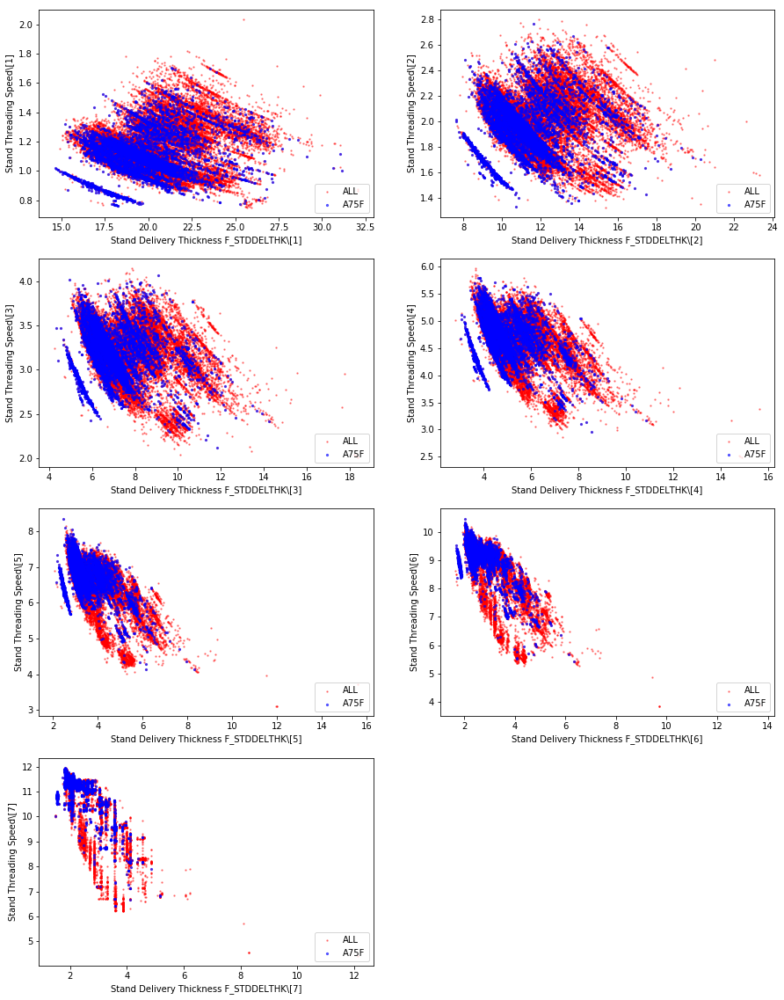

In [11]:
#各軋機出口設定厚度與穿帶速度關係
features_1 = ['Stand Delivery Thickness F_STDDELTHK\[1]','Stand Delivery Thickness F_STDDELTHK\[2]','Stand Delivery Thickness F_STDDELTHK\[3]',
              'Stand Delivery Thickness F_STDDELTHK\[4]','Stand Delivery Thickness F_STDDELTHK\[5]','Stand Delivery Thickness F_STDDELTHK\[6]',
              'Stand Delivery Thickness F_STDDELTHK\[7]',]
features_2 = ["Stand Threading Speed\[1]", "Stand Threading Speed\[2]", "Stand Threading Speed\[3]", "Stand Threading Speed\[4]",
              "Stand Threading Speed\[5]", "Stand Threading Speed\[6]", "Stand Threading Speed\[7]"]

fig = pl.figure(figsize=(15,20))
for i in range(7):
    pl.subplot(4, 2, 1+i)
    p1 = plt.scatter(A75Fdropna[features_1[i]] , A75Fdropna[features_2[i]],
                     c='r',alpha=0.4,s=2)
    p2 = plt.scatter(A75Fdropna[A75Fdropna.A75F==1][features_1[i]] , A75Fdropna[A75Fdropna.A75F==1][features_2[i]],
                     c='b',alpha=0.6,s=5)
    plt.xlabel(features_1[i])
    plt.ylabel(features_2[i])
    plt.legend([p1, p2], ['ALL', 'A75F'], loc='lower right', scatterpoints=1)

plt.show()

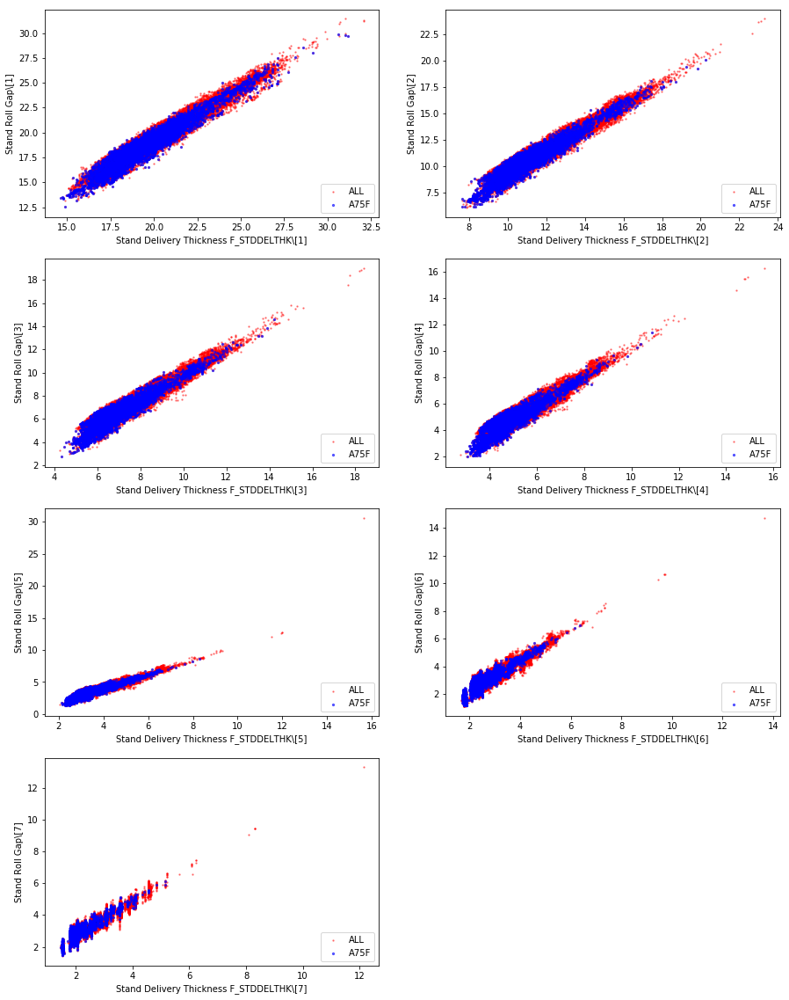

In [12]:
#各軋機出口設定厚度度與Roll Gap關係
features_1 = ['Stand Delivery Thickness F_STDDELTHK\[1]','Stand Delivery Thickness F_STDDELTHK\[2]','Stand Delivery Thickness F_STDDELTHK\[3]',
              'Stand Delivery Thickness F_STDDELTHK\[4]','Stand Delivery Thickness F_STDDELTHK\[5]','Stand Delivery Thickness F_STDDELTHK\[6]',
              'Stand Delivery Thickness F_STDDELTHK\[7]',]
features_2 = ["Stand Roll Gap\[1]", "Stand Roll Gap\[2]", "Stand Roll Gap\[3]", "Stand Roll Gap\[4]", "Stand Roll Gap\[5]", 
              "Stand Roll Gap\[6]", "Stand Roll Gap\[7]", ]

fig = pl.figure(figsize=(15,20))
for i in range(7):
    pl.subplot(4, 2, 1+i)
    p1 = plt.scatter(A75Fdropna[features_1[i]] , A75Fdropna[features_2[i]],
                     c='r',alpha=0.4,s=2)
    p2 = plt.scatter(A75Fdropna[A75Fdropna.A75F==1][features_1[i]] , A75Fdropna[A75Fdropna.A75F==1][features_2[i]],
                     c='b',alpha=0.6,s=5)
    plt.xlabel(features_1[i])
    plt.ylabel(features_2[i])
    plt.legend([p1, p2], ['ALL', 'A75F'], loc='lower right', scatterpoints=1)

plt.show()

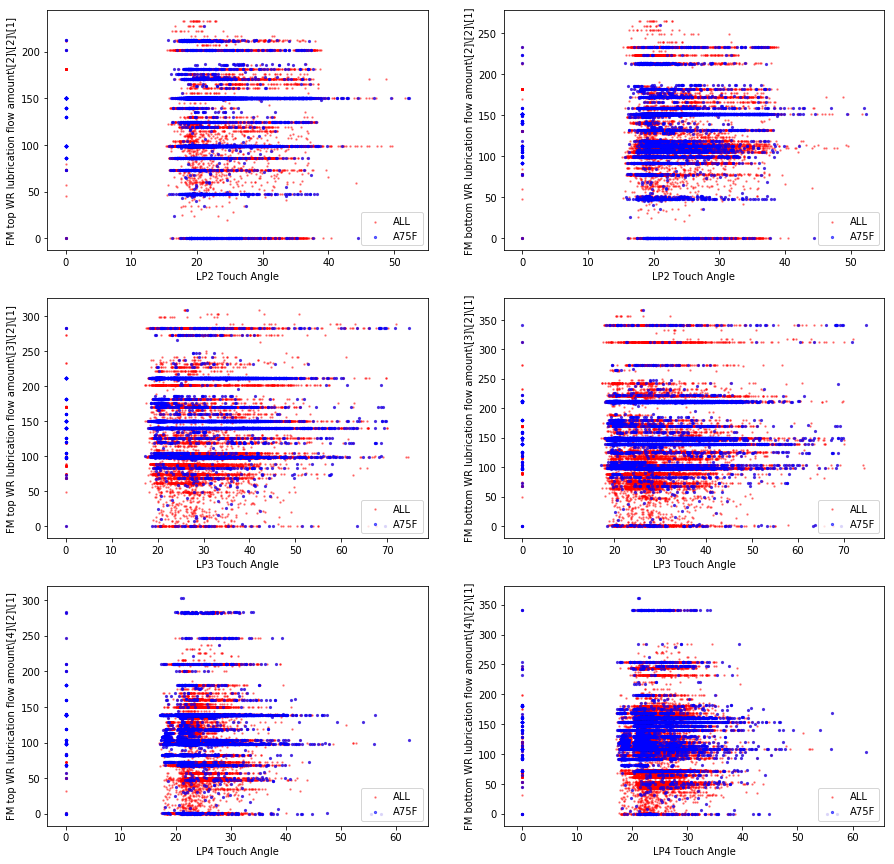

In [13]:
#各軋機上下軋延油與LP角度關係
features_1 = ['LP2 Touch Angle', 'LP3 Touch Angle', 'LP4 Touch Angle']
features_2 = ["FM top WR lubrication flow amount\[2]\[2]\[1]", "FM bottom WR lubrication flow amount\[2]\[2]\[1]",
              "FM top WR lubrication flow amount\[3]\[2]\[1]", "FM bottom WR lubrication flow amount\[3]\[2]\[1]",
              "FM top WR lubrication flow amount\[4]\[2]\[1]", "FM bottom WR lubrication flow amount\[4]\[2]\[1]",]

fig = pl.figure(figsize=(15,15))
for i in range(3):
    for j in range(2):
        pl.subplot(3, 2, i*2+j+1)
        p1 = plt.scatter(A75Fdropna[features_1[i]] , A75Fdropna[features_2[i*2+j]],
                     c='r',alpha=0.4,s=2)
        p2 = plt.scatter(A75Fdropna[A75Fdropna.A75F==1][features_1[i]] , A75Fdropna[A75Fdropna.A75F==1][features_2[i*2+j]],
                     c='b',alpha=0.6,s=5)
        plt.xlabel(features_1[i])
        plt.ylabel(features_2[i*2+j])
        plt.legend([p1, p2], ['ALL', 'A75F'], loc='lower right', scatterpoints=1)

plt.show()

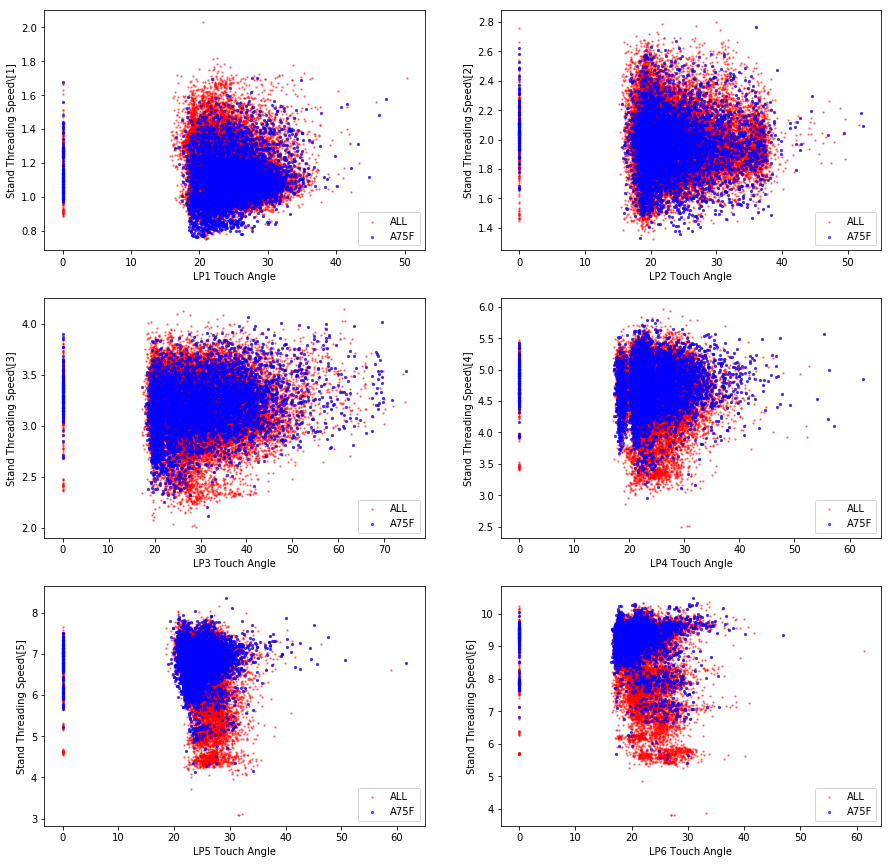

In [14]:
#各LP角度與穿帶速度關係
features_1 = ['LP1 Touch Angle', 'LP2 Touch Angle', 'LP3 Touch Angle', 'LP4 Touch Angle', 'LP5 Touch Angle', 'LP6 Touch Angle']
features_2 = ["Stand Threading Speed\[1]", "Stand Threading Speed\[2]", "Stand Threading Speed\[3]", "Stand Threading Speed\[4]",
              "Stand Threading Speed\[5]", "Stand Threading Speed\[6]", "Stand Threading Speed\[7]"]

fig = pl.figure(figsize=(15,15))
for i in range(6):
    pl.subplot(3, 2, 1+i)
    p1 = plt.scatter(A75Fdropna[features_1[i]] , A75Fdropna[features_2[i]],
                     c='r',alpha=0.4,s=2)
    p2 = plt.scatter(A75Fdropna[A75Fdropna.A75F==1][features_1[i]] , A75Fdropna[A75Fdropna.A75F==1][features_2[i]],
                     c='b',alpha=0.6,s=5)
    plt.xlabel(features_1[i])
    plt.ylabel(features_2[i])
    plt.legend([p1, p2], ['ALL', 'A75F'], loc='lower right', scatterpoints=1)

plt.show()

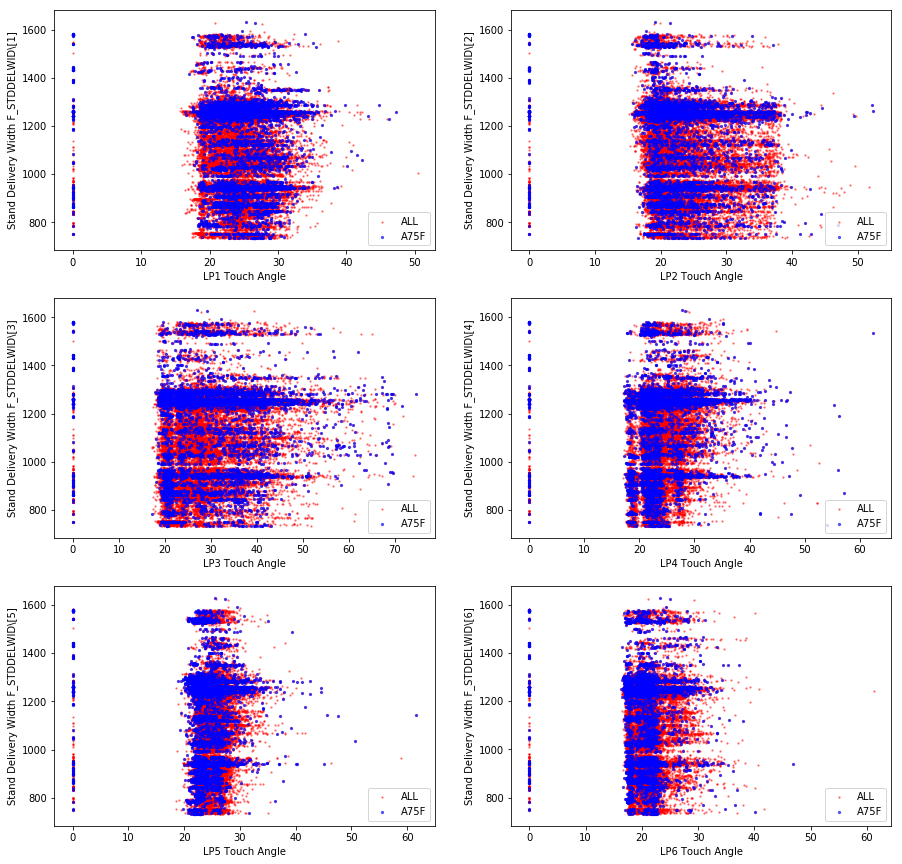

In [15]:
#各軋機出口寬度與LP角度關係
features_1 = ['LP1 Touch Angle', 'LP2 Touch Angle', 'LP3 Touch Angle', 'LP4 Touch Angle', 'LP5 Touch Angle', 'LP6 Touch Angle']
features_2 = ["Stand Delivery Width F_STDDELWID\[1]", "Stand Delivery Width F_STDDELWID\[2]", "Stand Delivery Width F_STDDELWID\[3]",
              "Stand Delivery Width F_STDDELWID\[4]", "Stand Delivery Width F_STDDELWID\[5]", "Stand Delivery Width F_STDDELWID\[6]",
              "Stand Delivery Width F_STDDELWID\[7]", ]

fig = pl.figure(figsize=(15,15))
for i in range(6):
    pl.subplot(3, 2, 1+i)
    p1 = plt.scatter(A75Fdropna[features_1[i]] , A75Fdropna[features_2[i]],
                     c='r',alpha=0.4,s=2)
    p2 = plt.scatter(A75Fdropna[A75Fdropna.A75F==1][features_1[i]] , A75Fdropna[A75Fdropna.A75F==1][features_2[i]],
                     c='b',alpha=0.6,s=5)
    plt.xlabel(features_1[i])
    plt.ylabel(features_2[i])
    plt.legend([p1, p2], ['ALL', 'A75F'], loc='lower right', scatterpoints=1)

plt.show()

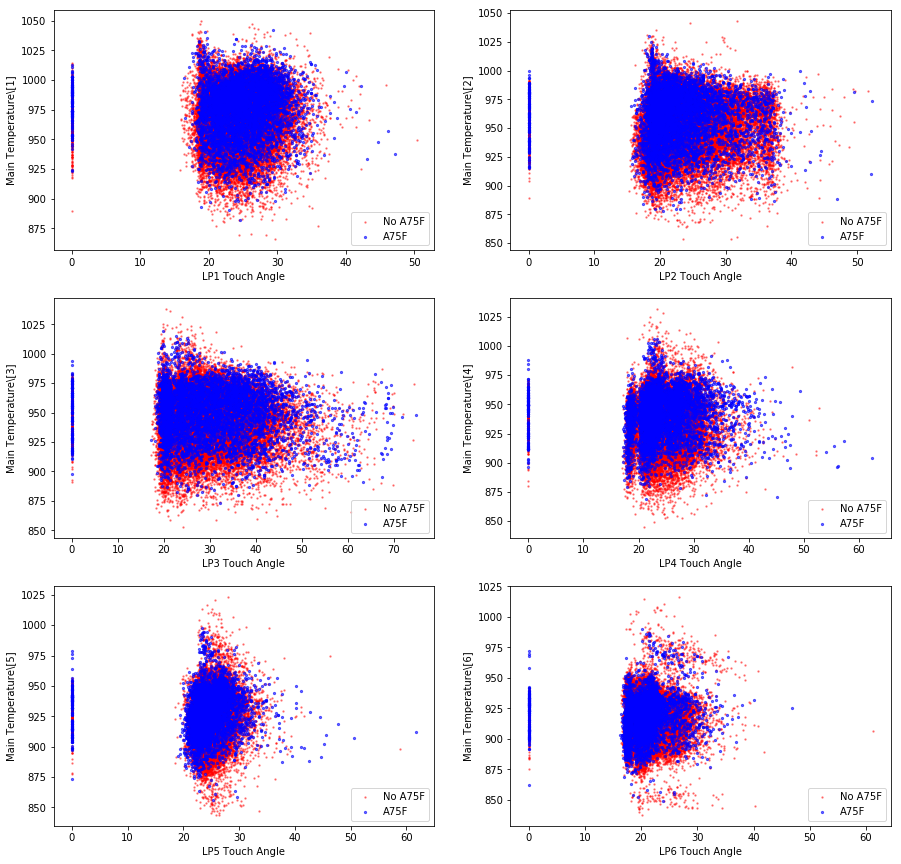

In [16]:
#各軋機溫度與LP角度關係
features_1 = ['LP1 Touch Angle', 'LP2 Touch Angle', 'LP3 Touch Angle', 'LP4 Touch Angle', 'LP5 Touch Angle', 'LP6 Touch Angle']
features_2 = ["Main Temperature\[1]", "Main Temperature\[2]", "Main Temperature\[3]", "Main Temperature\[4]",
              "Main Temperature\[5]", "Main Temperature\[6]", "Main Temperature\[7]"]

fig = pl.figure(figsize=(15,15))
for i in range(6):
    pl.subplot(3, 2, 1+i)
    p1 = plt.scatter(A75Fdropna[A75Fdropna.A75F==0][features_1[i]] , A75Fdropna[A75Fdropna.A75F==0][features_2[i]],
                     c='r',alpha=0.4,s=2)
    p2 = plt.scatter(A75Fdropna[A75Fdropna.A75F==1][features_1[i]] , A75Fdropna[A75Fdropna.A75F==1][features_2[i]],
                     c='b',alpha=0.6,s=5)
    plt.xlabel(features_1[i])
    plt.ylabel(features_2[i])
    plt.legend([p1, p2], ['No A75F', 'A75F'], loc='lower right', scatterpoints=1)

plt.show()

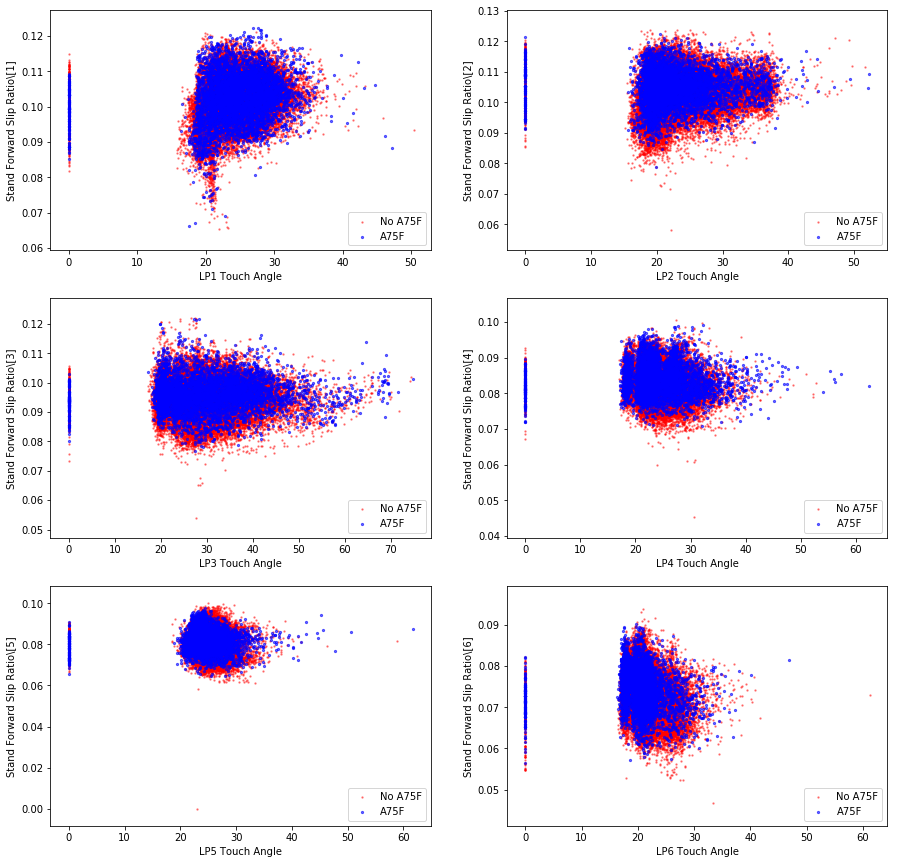

In [17]:
#各軋機前滑擦與LP角度關係
features_1 = ['LP1 Touch Angle', 'LP2 Touch Angle', 'LP3 Touch Angle', 'LP4 Touch Angle', 'LP5 Touch Angle', 'LP6 Touch Angle']
features_2 = ["Stand Forward Slip Ratio\[1]", "Stand Forward Slip Ratio\[2]", "Stand Forward Slip Ratio\[3]", 
              "Stand Forward Slip Ratio\[4]", "Stand Forward Slip Ratio\[5]", "Stand Forward Slip Ratio\[6]", 
              "Stand Forward Slip Ratio\[7]" ]

fig = pl.figure(figsize=(15,15))
for i in range(6):
    pl.subplot(3, 2, 1+i)
    p1 = plt.scatter(A75Fdropna[A75Fdropna.A75F==0][features_1[i]] , A75Fdropna[A75Fdropna.A75F==0][features_2[i]],
                     c='r',alpha=0.4,s=2)
    p2 = plt.scatter(A75Fdropna[A75Fdropna.A75F==1][features_1[i]] , A75Fdropna[A75Fdropna.A75F==1][features_2[i]],
                     c='b',alpha=0.6,s=5)
    plt.xlabel(features_1[i])
    plt.ylabel(features_2[i])
    plt.legend([p1, p2], ['No A75F', 'A75F'], loc='lower right', scatterpoints=1)

plt.show()

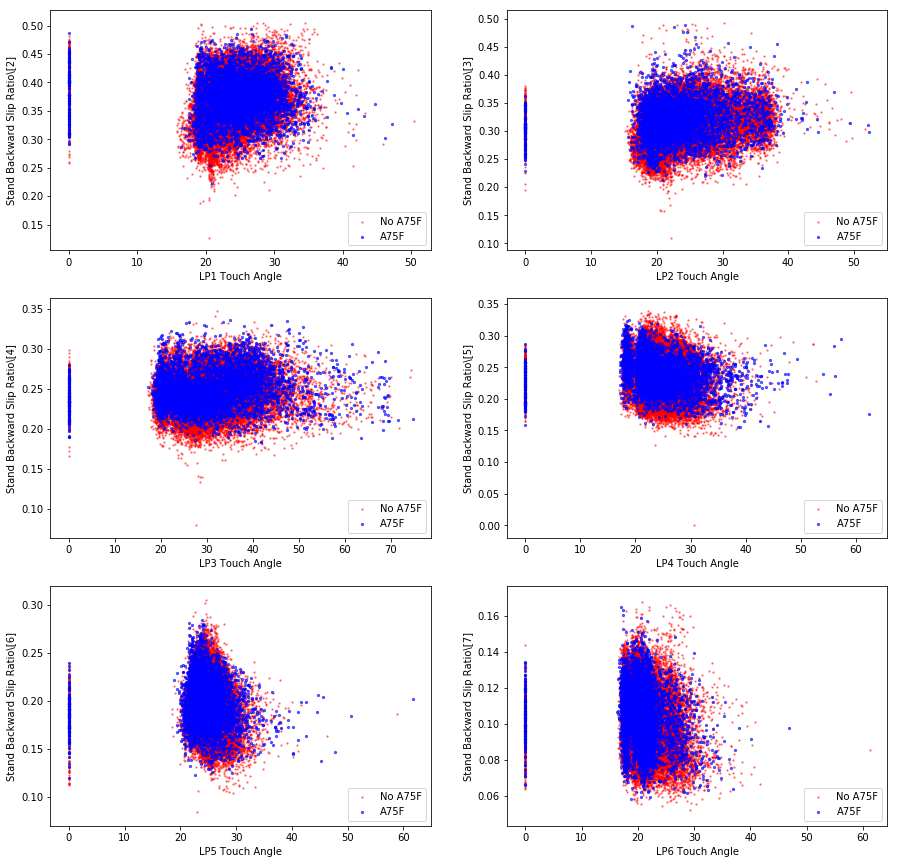

In [18]:
#各軋機後滑擦與LP角度關係
features_1 = ['LP1 Touch Angle', 'LP2 Touch Angle', 'LP3 Touch Angle', 'LP4 Touch Angle', 'LP5 Touch Angle', 'LP6 Touch Angle']
features_2 = ['Stand Backward Slip Ratio\[1]','Stand Backward Slip Ratio\[2]','Stand Backward Slip Ratio\[3]',
              'Stand Backward Slip Ratio\[4]','Stand Backward Slip Ratio\[5]','Stand Backward Slip Ratio\[6]',
              'Stand Backward Slip Ratio\[7]']

fig = pl.figure(figsize=(15,15))
for i in range(6):
    pl.subplot(3, 2, 1+i)
    p1 = plt.scatter(A75Fdropna[A75Fdropna.A75F==0][features_1[i]] , A75Fdropna[A75Fdropna.A75F==0][features_2[i+1]],
                     c='r',alpha=0.4,s=2)
    p2 = plt.scatter(A75Fdropna[A75Fdropna.A75F==1][features_1[i]] , A75Fdropna[A75Fdropna.A75F==1][features_2[i+1]],
                     c='b',alpha=0.6,s=5)
    plt.xlabel(features_1[i])
    plt.ylabel(features_2[i+1])
    plt.legend([p1, p2], ['No A75F', 'A75F'], loc='lower right', scatterpoints=1)

plt.show()

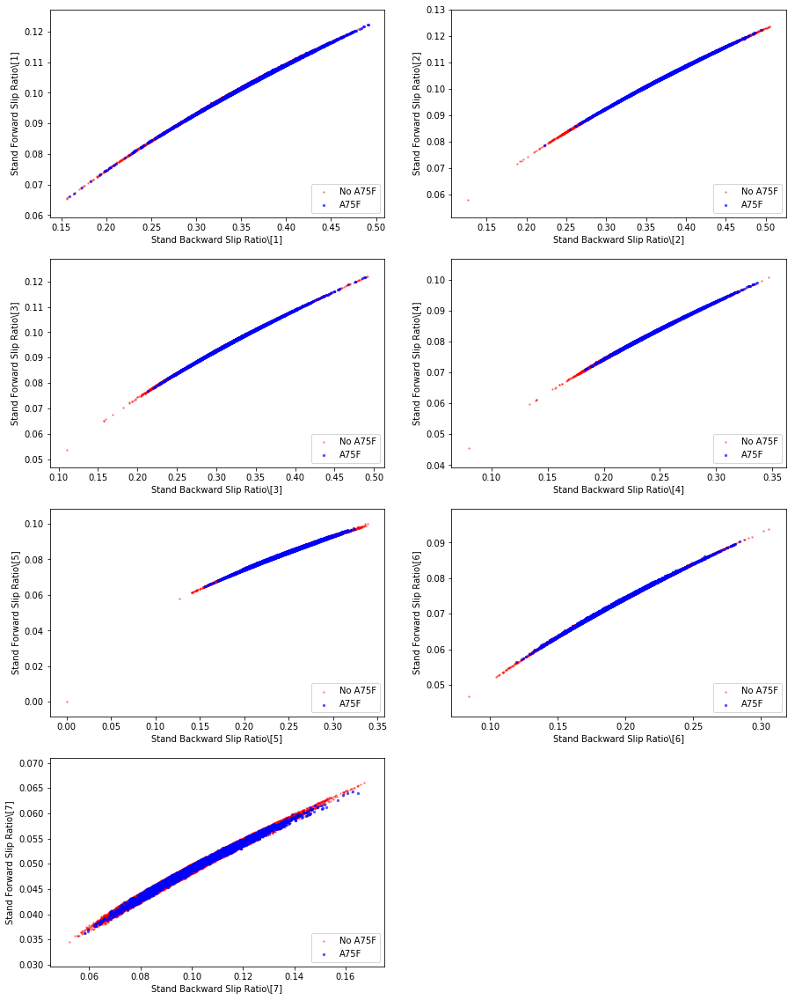

In [19]:
#各軋機前後滑擦關係
features_1 = ['Stand Backward Slip Ratio\[1]','Stand Backward Slip Ratio\[2]','Stand Backward Slip Ratio\[3]',
              'Stand Backward Slip Ratio\[4]','Stand Backward Slip Ratio\[5]','Stand Backward Slip Ratio\[6]',
              'Stand Backward Slip Ratio\[7]']
features_2 = ["Stand Forward Slip Ratio\[1]", "Stand Forward Slip Ratio\[2]", "Stand Forward Slip Ratio\[3]", 
              "Stand Forward Slip Ratio\[4]", "Stand Forward Slip Ratio\[5]", "Stand Forward Slip Ratio\[6]", 
              "Stand Forward Slip Ratio\[7]" ]

fig = pl.figure(figsize=(15,20))
for i in range(7):
    pl.subplot(4, 2, 1+i)
    p1 = plt.scatter(A75Fdropna[A75Fdropna.A75F==0][features_1[i]] , A75Fdropna[A75Fdropna.A75F==0][features_2[i]],
                     c='r',alpha=0.4,s=2)
    p2 = plt.scatter(A75Fdropna[A75Fdropna.A75F==1][features_1[i]] , A75Fdropna[A75Fdropna.A75F==1][features_2[i]],
                     c='b',alpha=0.6,s=5)
    plt.xlabel(features_1[i])
    plt.ylabel(features_2[i])
    plt.legend([p1, p2], ['No A75F', 'A75F'], loc='lower right', scatterpoints=1)

plt.show()

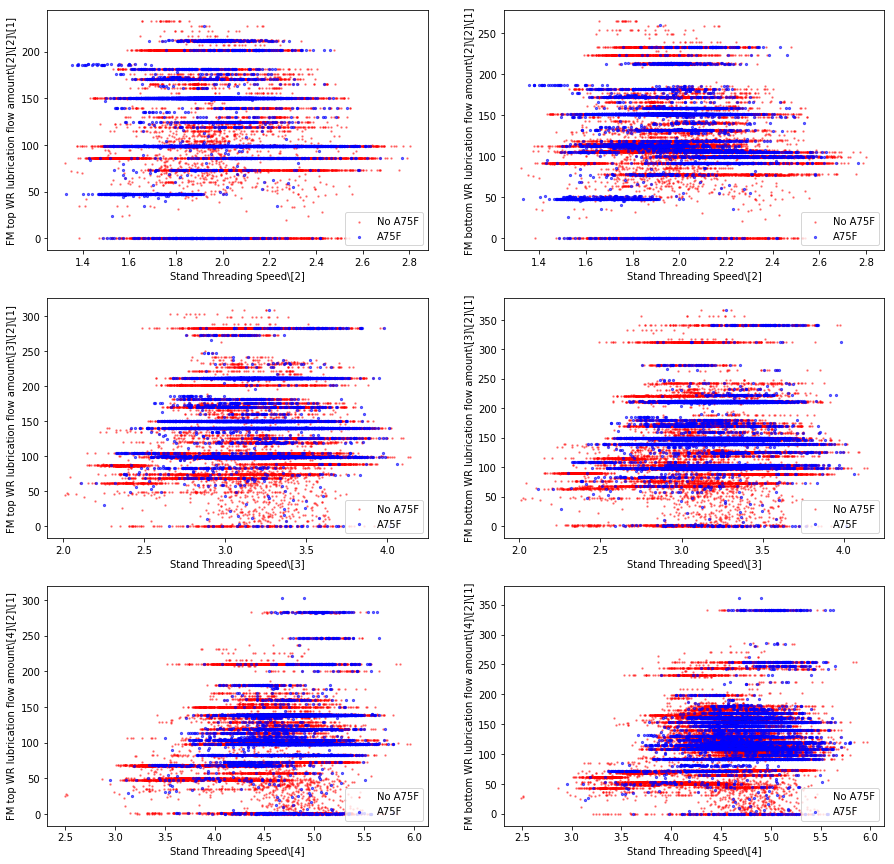

In [20]:
#各軋機上下軋延油與穿帶速度關係
features_1 = ['Stand Threading Speed\[2]', 'Stand Threading Speed\[3]', 'Stand Threading Speed\[4]']
features_2 = ["FM top WR lubrication flow amount\[2]\[2]\[1]", "FM bottom WR lubrication flow amount\[2]\[2]\[1]",
              "FM top WR lubrication flow amount\[3]\[2]\[1]", "FM bottom WR lubrication flow amount\[3]\[2]\[1]",
              "FM top WR lubrication flow amount\[4]\[2]\[1]", "FM bottom WR lubrication flow amount\[4]\[2]\[1]",]
fig = pl.figure(figsize=(15,15))

for i in range(3):
    for j in range(2):
        pl.subplot(3, 2, i*2+j+1)
        p1 = plt.scatter(A75Fdropna[A75Fdropna.A75F==0][features_1[i]] , A75Fdropna[A75Fdropna.A75F==0][features_2[i*2+j]],
                     c='r',alpha=0.4,s=2)
        p2 = plt.scatter(A75Fdropna[A75Fdropna.A75F==1][features_1[i]] , A75Fdropna[A75Fdropna.A75F==1][features_2[i*2+j]],
                     c='b',alpha=0.6,s=5)
        plt.xlabel(features_1[i])
        plt.ylabel(features_2[i*2+j])
        plt.legend([p1, p2], ['No A75F', 'A75F'], loc='lower right', scatterpoints=1)
    
plt.show()

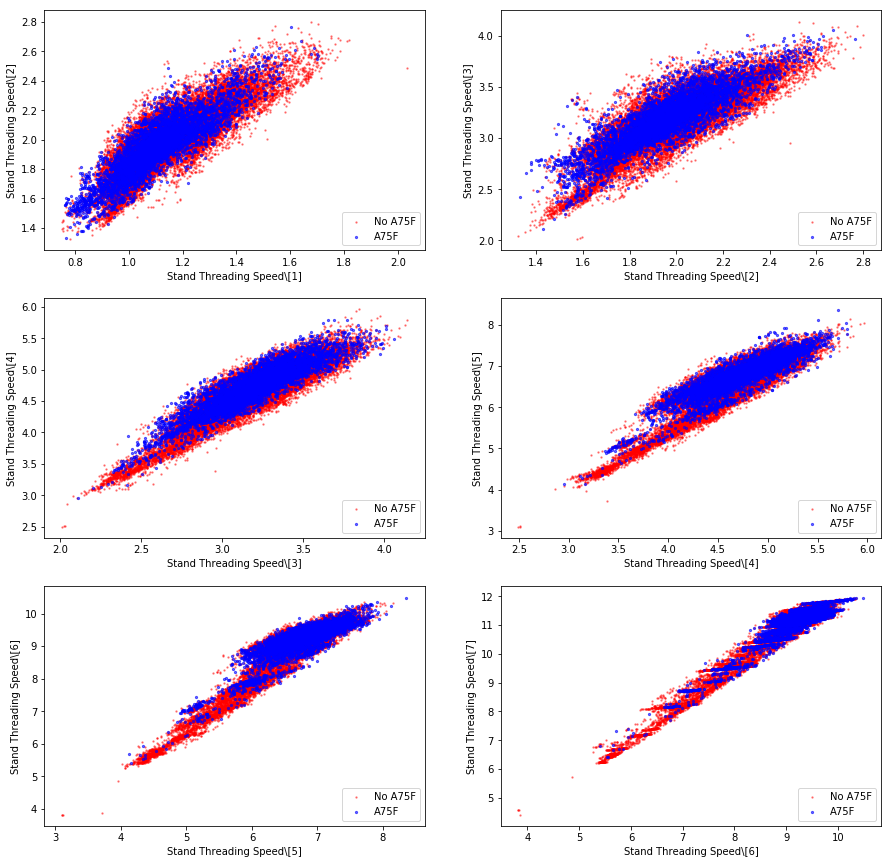

In [21]:
#各軋機前後站穿帶速度關係
features = ['Stand Threading Speed\[1]', 'Stand Threading Speed\[2]', 'Stand Threading Speed\[3]', 'Stand Threading Speed\[4]',
            'Stand Threading Speed\[5]', 'Stand Threading Speed\[6]', 'Stand Threading Speed\[7]']

fig = pl.figure(figsize=(15,15))

for i in range(6):
    pl.subplot(3, 2, 1+i)
    p1 = plt.scatter(A75Fdropna[A75Fdropna.A75F==0][features[i]] , A75Fdropna[A75Fdropna.A75F==0][features[i+1]],
                     c='r',alpha=0.4,s=2)
    p2 = plt.scatter(A75Fdropna[A75Fdropna.A75F==1][features[i]] , A75Fdropna[A75Fdropna.A75F==1][features[i+1]],
                     c='b',alpha=0.6,s=5)
    plt.xlabel(features[i])
    plt.ylabel(features[i+1])
    plt.legend([p1, p2], ['No A75F', 'A75F'], loc='lower right', scatterpoints=1)
    
plt.show()

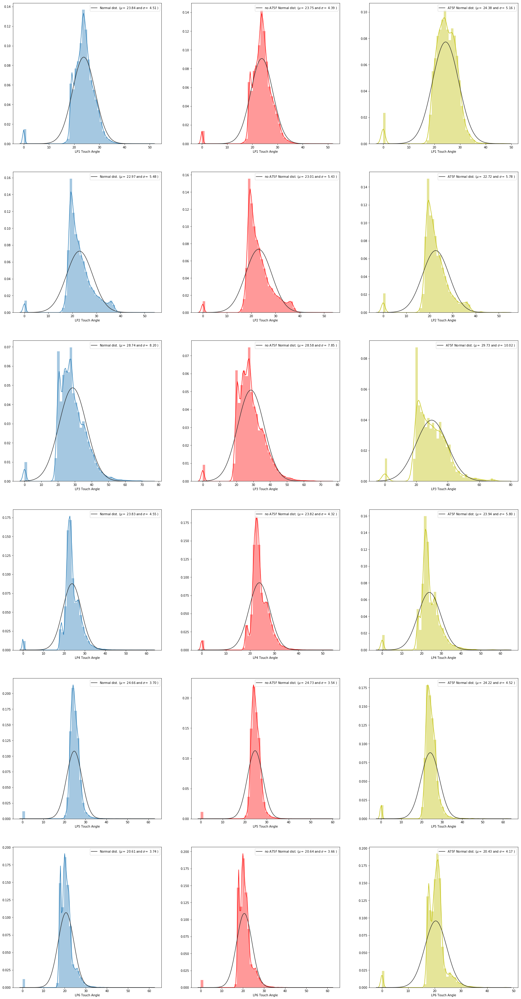

In [22]:
#各站間角度分布
features = ['LP1 Touch Angle', 'LP2 Touch Angle', 'LP3 Touch Angle', 'LP4 Touch Angle', 'LP5 Touch Angle', 'LP6 Touch Angle']
fig = pl.figure(figsize=(30,60))

for i in range(6):
    pl.subplot(6, 3, 1+i*3)
    sns.distplot(A75Fdropna[features[i]], fit=stats.norm)
    (mu, sigma) = stats.norm.fit(A75Fdropna[features[i]])
    plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)], loc='best')
    pl.subplot(6, 3, 2+i*3)
    sns.distplot(A75Fdropna[A75Fdropna.A75F==0][features[i]], fit=stats.norm, color='r')
    (mu, sigma) = stats.norm.fit(A75Fdropna[A75Fdropna.A75F==0][features[i]])
    plt.legend(['no A75F Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)], loc='best')
    pl.subplot(6, 3, 3+i*3)
    sns.distplot(A75Fdropna[A75Fdropna.A75F==1][features[i]], fit=stats.norm, color='y')
    (mu, sigma) = stats.norm.fit(A75Fdropna[A75Fdropna.A75F==1][features[i]])
    plt.legend(['A75F Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)], loc='best')

plt.show()

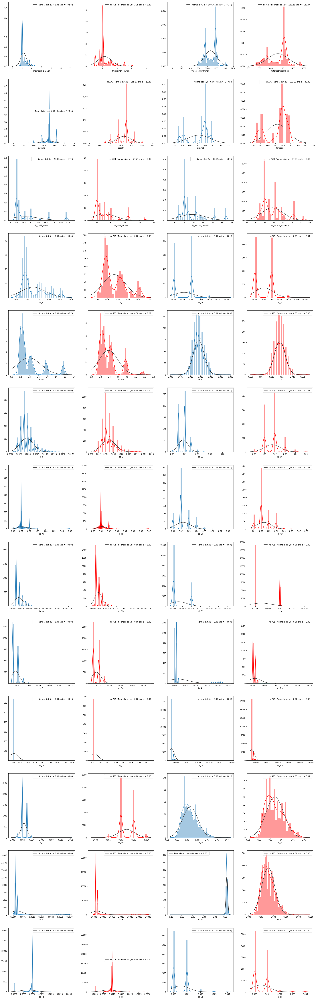

In [23]:
features = ['fmtargetthickwhqh', 'fmtargetwidthwhqh', 'targetft', 'targetct', 'ds_yield_stress', 'ds_tensile_strength',
            'ds_C','ds_Si','ds_Mn','ds_P','ds_S','ds_Cu','ds_Ni','ds_Cr','ds_Mo','ds_V','ds_Sn','ds_Nb','ds_Ti','ds_Ca',
            'ds_Co','ds_Al','ds_B','ds_N2','ds_Pb','ds_Sb']
fig = pl.figure(figsize=(30,100))

for i in range(13):
    for j in range(2):
        pl.subplot(13, 4, i*4+j*2+1)
        sns.distplot(A75Fdropna[features[i*2+j]], fit=stats.norm)
        (mu, sigma) = stats.norm.fit(A75Fdropna[features[i*2+j]])
        plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)], loc='best')
        pl.subplot(13, 4, i*4+j*2+2)
        sns.distplot(A75Fdropna[A75Fdropna.A75F==1][features[i*2+j]], fit=stats.norm, color='r')
        (mu, sigma) = stats.norm.fit(A75Fdropna[A75Fdropna.A75F==1][features[i*2+j]])
        plt.legend(['no A75F Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)], loc='best')

plt.show()

In [24]:
A75Fdropna.shape

(42438, 132)

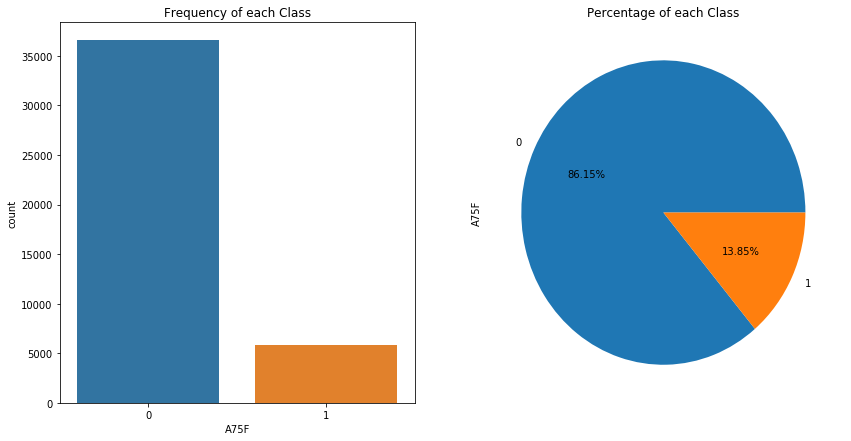

In [25]:
#A75Fdropna[A75Fdropna>0].count() #統計各欄位數值大於0的
fig, axs = plt.subplots(1,2,figsize=(14,7))
sns.countplot(x='A75F',data=A75Fdropna, ax=axs[0])
axs[0].set_title("Frequency of each Class")
A75Fdropna['A75F'].value_counts().plot(x=None,y=None, kind='pie', ax=axs[1],autopct='%1.2f%%')
axs[1].set_title("Percentage of each Class")
plt.show()

In [26]:
# #將無缺失值資料儲存
# A75Fdropna.to_csv("A75Fdropna.csv", index= True)
# A75Fdropna.columns[A75Fdropna.isnull().any()] #查列出有缺失值行

In [27]:
#讓feature_names不能包含[，]或<
import re
regex = re.compile(r"\[|\]|<", re.IGNORECASE)
A75Fdropna.columns = [regex.sub("_", col) if any(x in str(col) for x in set(('[', ']', '<'))) else col for col in A75Fdropna.columns.values]

In [28]:
#將資料分X及Y
trainA75F = A75Fdropna.drop(['A75F','coilno','color'],axis=1)
print(trainA75F.shape)
defectA75F =  A75Fdropna.loc[:,['A75F']]
print(defectA75F.shape)
print(defectA75F[defectA75F.A75F==1].shape)
print(defectA75F[defectA75F.A75F==0].shape)
n_sample = defectA75F.shape[0]
n_pos_sample = defectA75F[defectA75F.A75F == 0].shape[0]
n_neg_sample = defectA75F[defectA75F.A75F == 1].shape[0]
print('樣本個數：{}; 正樣本佔{:.2%}; 負樣本占{:.2%}'.format(n_sample,
                                                   n_pos_sample / n_sample,
                                                   n_neg_sample / n_sample))
print('特徵維度：', trainA75F.shape[1])

(42438, 129)
(42438, 1)
(5878, 1)
(36560, 1)
樣本個數：42438; 正樣本佔86.15%; 負樣本占13.85%
特徵維度： 129


### 處理不平𧗾樣本

In [29]:
!!pip install imblearn #下載imbalanced-learn

['Requirement already satisfied: imblearn in /opt/conda/lib/python3.6/site-packages (0.0)',
 'Requirement already satisfied: imbalanced-learn in /opt/conda/lib/python3.6/site-packages (from imblearn) (0.4.3)',
 'Requirement already satisfied: numpy>=1.8.2 in /opt/conda/lib/python3.6/site-packages (from imbalanced-learn->imblearn) (1.15.2)',
 'Requirement already satisfied: scikit-learn>=0.20 in /opt/conda/lib/python3.6/site-packages (from imbalanced-learn->imblearn) (0.20.1)',
 'Requirement already satisfied: scipy>=0.13.3 in /opt/conda/lib/python3.6/site-packages (from imbalanced-learn->imblearn) (1.1.0)']

In [30]:
### 下採樣
A75Fdropna.reset_index(drop=True,inplace=True)
A75Fdropna_a75f = len(A75Fdropna[A75Fdropna.A75F==1]) #A75F=1的行數量
print (A75Fdropna_a75f)  
a75f_indices = np.array(A75Fdropna[A75Fdropna.A75F == 1].index) #A75F=1的行轉為np.arry
print (a75f_indices.shape)
no_a75f_indices = A75Fdropna[A75Fdropna.A75F == 0].index #A75F=0的行
print (no_a75f_indices.shape)
random_normal_indices =np.random.choice(no_a75f_indices,A75Fdropna_a75f,replace = False) #以A75F=1的行數量，隨機挑選A75F=0的index
random_normal_indices = np.array(random_normal_indices) #挑選A75F=0的index後轉為np.arry
print (random_normal_indices.shape)  
under_sample_indices = np.concatenate([a75f_indices,random_normal_indices]) #合併A75F=1 & A75F=0 np.arry，命名為under_sample_indices
print (under_sample_indices.shape)   
under_sample_data = A75Fdropna.iloc[under_sample_indices,:] #依照under_sample_indices選取data  
print (len(under_sample_data[under_sample_data.A75F==1])/len(under_sample_data)) # 正负样本的比例都是 0.5
print("透過隨機挑選平衡正負樣本後 ", len(under_sample_data))
X_unsample = under_sample_data.drop(['A75F','coilno','color'],axis=1) #採樣後X
y_unsample = under_sample_data.loc[:,['A75F']] #採樣後y
n_unsample = y_unsample.shape[0]
n_pos_unsample = y_unsample[y_unsample.A75F == 0].shape[0]
n_neg_unsample = y_unsample[y_unsample.A75F == 1].shape[0]
print('樣本個數：{}; 正樣本佔{:.2%}; 負樣本占{:.2%}'.format(n_unsample,
                                                   n_pos_unsample / n_unsample,
                                                   n_neg_unsample / n_unsample))
print('特徵維度：', X_unsample.shape[1])
print(y_unsample[y_unsample.A75F == 0].shape)

5878
(5878,)
(36560,)
(5878,)
(11756,)
0.5
透過隨機挑選平衡正負樣本後  11756
樣本個數：11756; 正樣本佔50.00%; 負樣本占50.00%
特徵維度： 129
(5878, 1)


In [31]:
# 上採樣
from imblearn.over_sampling import SMOTE # 導入SMOTE算法

sm = SMOTE(random_state=42)    # 處理過樣本的方法
X_smote, y_smote = sm.fit_sample(trainA75F, defectA75F)
print('透過SMOTE方法平衡正負樣本後')
n_sample = y_smote.shape[0]
n_pos_sample = y_smote[y_smote == 0].shape[0]
n_neg_sample = y_smote[y_smote == 1].shape[0]
print('樣本個數：{}; 正樣本佔{:.2%}; 負樣本占{:.2%}'.format(n_sample,
                                                   n_pos_sample / n_sample,
                                                   n_neg_sample / n_sample))
print('特徵維度：', X_smote.shape[1])

透過SMOTE方法平衡正負樣本後
樣本個數：73120; 正樣本佔50.00%; 負樣本占50.00%
特徵維度： 129


In [32]:
'''-----------------------------------資料前處理---------------------------------------------'''
# split the data into training and validation sets資料分類為訓練及測試
# train_test_split(train_data：所要劃分的樣本特徵集,train_target：所要劃分的樣本結果,
# test_size：樣本佔比，如果是整數的話就是樣本的數量,random_state：是隨機數的種子，比如你每次都填1，其他參數一樣的情況下你得到的隨機數組是一樣的。
# 但填0或不填，每次都會不一樣。)

X_train, X_test, y_train, y_test = train_test_split(trainA75F, defectA75F, test_size=0.2, random_state=42)
X_train_v, X_test_v, y_train_v, y_test_v = train_test_split(X_train, y_train, test_size=0.1, random_state=42)
X_train_u, X_test_u, y_train_u, y_test_u = train_test_split(X_unsample, y_unsample, test_size=0.2, random_state=42)
X_train_uv, X_test_uv, y_train_uv, y_test_uv = train_test_split(X_train_u, y_train_u, test_size=0.1, random_state=42)
X_train_s, X_test_s, y_train_s, y_test_s = train_test_split(X_smote, y_smote, test_size=0.2, random_state=42)
X_train_sv, X_test_sv, y_train_sv, y_test_sv = train_test_split(X_train_s,y_train_s, test_size=0.1, random_state=42)
print(X_train.shape,y_train.shape,X_test.shape,y_test.shape)
print(X_train_u.shape,y_train_u.shape,X_test_u.shape,y_test_u.shape)
print(X_train_s.shape,y_train_s.shape,X_test_s.shape,y_test_s.shape)

(33950, 129) (33950, 1) (8488, 129) (8488, 1)
(9404, 129) (9404, 1) (2352, 129) (2352, 1)
(58496, 129) (58496,) (14624, 129) (14624,)


## train data normalize
#Z-Score
X_train_1 = preprocessing.scale(X_train, axis=0)
#Maxmin Scale
#train_new = preprocessing.minmax_scale(train_new, axis=0, feature_range=(0,1))
print(X_train.shape)
#print(X_train)

## test data normalize
#Z-Score
X_test_1 = preprocessing.scale(X_test, axis=0)
#Maxmin Scale
#train_new = preprocessing.minmax_scale(train_new, axis=0, feature_range=(0,1))
print(X_test.shape)
#print(X_test)

### 混淆矩陣

In [33]:
def plot_confusion_matrix(cm, classes, title='Confusion matrix', cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    """
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=0)
    plt.yticks(tick_marks, classes)

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

### xgboost

In [34]:
from xgboost import XGBClassifier, plot_importance, plot_tree, to_graphviz
from sklearn.metrics import accuracy_score
#Original sample no eval_set
model = XGBClassifier(learning_rate =0.1,n_estimators=1000,
                       max_depth=20,min_child_weight=1,gamma=0,
                       subsample=0.8,colsample_bytree=0.8,
                       objective= 'binary:logistic',nthread=4,
                       scale_pos_weight=1,seed=27)
model.fit(X_train, y_train)
#Original sample
XGBC = XGBClassifier(learning_rate =0.1,n_estimators=1000,
                      max_depth=20,min_child_weight=1,gamma=0,
                      subsample=0.8,colsample_bytree=0.8,
                      objective= 'binary:logistic',nthread=4,
                      scale_pos_weight=1,seed=27,verbose=False)
XGBC.fit(X_train_v,y_train_v,eval_metric="auc",eval_set=[(X_test_v,y_test_v)], verbose=False)
#下採樣
XGBC_u = XGBClassifier(learning_rate =0.1,n_estimators=1000,
                        max_depth=20,min_child_weight=1,gamma=0,
                        subsample=0.8,colsample_bytree=0.8,
                        objective= 'binary:logistic',nthread=4,
                        scale_pos_weight=1,seed=27,verbose=False)
XGBC_u.fit(X_train_uv,y_train_uv,eval_metric="auc",eval_set=[(X_test_uv,y_test_uv)], verbose=False)
#上採樣
XGBC_s = XGBClassifier(learning_rate =0.1,n_estimators=1000,
                        max_depth=20,min_child_weight=1,gamma=0,
                        subsample=0.8,colsample_bytree=0.8,
                        objective= 'binary:logistic',nthread=4,
                        scale_pos_weight=1,seed=27,verbose=False)
XGBC_s.fit(X_train_sv,y_train_sv,eval_metric="auc",eval_set=[(X_test_sv,y_test_sv)], verbose=False)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_delta_step=0,
       max_depth=20, min_child_weight=1, missing=None, n_estimators=1000,
       n_jobs=1, nthread=4, objective='binary:logistic', random_state=0,
       reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=27, silent=True,
       subsample=0.8, verbose=False)

In [35]:
#Original sample no eval_set
xgboostA75F = model.predict(X_test)
print("Test set accuracy score(Original sample no eval_set): {:.5f}".format(accuracy_score(xgboostA75F, y_test,)))
#Original sample
predicted_XGBC = XGBC.predict(X_test) # 透過分類器產生預測结果
print("Test set accuracy score(Original sample): {:.5f}".format(accuracy_score(predicted_XGBC, y_test,)))
#under sample
predicted_XGBC_u = XGBC_u.predict(X_test_u) # 透過分類器產生預測下採樣结果
print("Test set accuracy score(under sample): {:.5f}".format(accuracy_score(predicted_XGBC_u, y_test_u,)))
#over sample
predicted_XGBC_s = XGBC_s.predict(X_test_s) # 透過分類器產生預測上採樣结果
print("Test set accuracy score(over sample): {:.5f}".format(accuracy_score(predicted_XGBC_s, y_test_s,)))

Test set accuracy score(Original sample no eval_set): 0.89609
Test set accuracy score(Original sample): 0.89279
Test set accuracy score(under sample): 0.81037
Test set accuracy score(over sample): 0.94742


In [36]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import auc
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
from sklearn.metrics import recall_score
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score
import pylab as pl
import itertools

### 混淆矩陣可視化

Recall metric in the Original sample no_eval_set dataset:  0.4049792531120332
Recall metric in the Original sample dataset:  0.3775933609958506
Recall metric in the under sample dataset:  0.8161016949152542
Recall metric in the over sample dataset:  0.9235921268452706


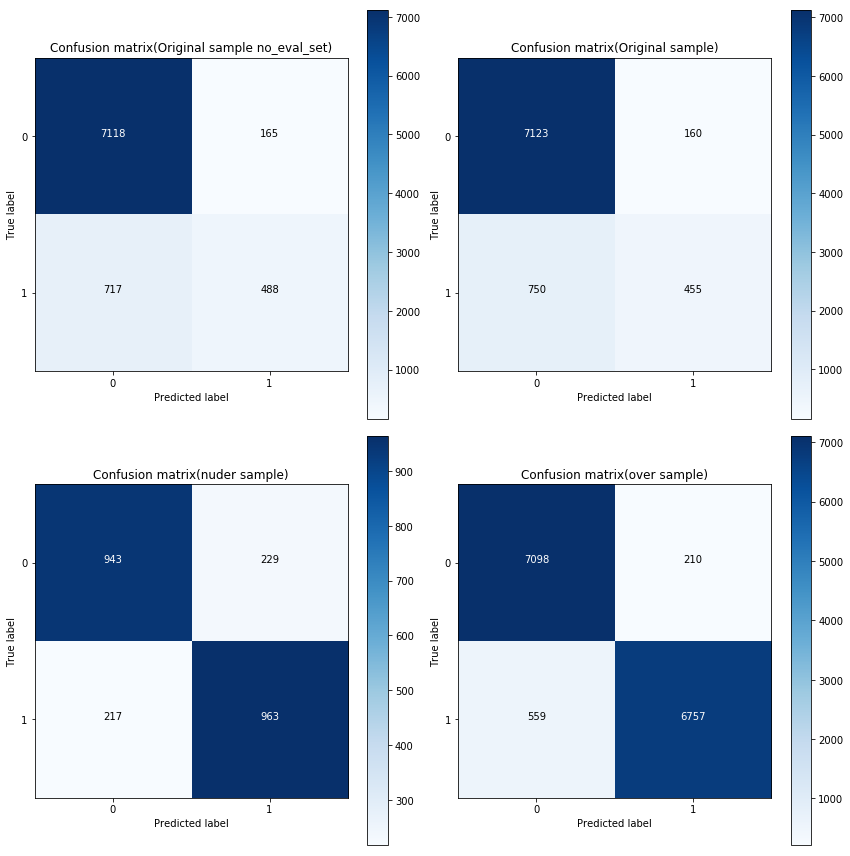

In [37]:
fig = pl.figure(figsize=(12,12))

# Compute confusion matrix
cnf_matrix_1 = confusion_matrix(y_test, xgboostA75F)  # 生成混淆矩陣
cnf_matrix_2 = confusion_matrix(y_test, predicted_XGBC)
cnf_matrix_3 = confusion_matrix(y_test_u, predicted_XGBC_u)
cnf_matrix_4 = confusion_matrix(y_test_s, predicted_XGBC_s)
np.set_printoptions(precision=2) #設定輸出精度

# Plot non-normalized confusion matrix
class_names = [0,1]
pl.subplot(2, 2, 1)
print("Recall metric in the Original sample no_eval_set dataset: ", cnf_matrix_1[1,1]/(cnf_matrix_1[1,0]+cnf_matrix_1[1,1]))
plot_confusion_matrix(cnf_matrix_1
                      , classes=class_names
                      , title='Confusion matrix(Original sample no_eval_set)')
pl.subplot(2, 2, 2)
print("Recall metric in the Original sample dataset: ", cnf_matrix_2[1,1]/(cnf_matrix_2[1,0]+cnf_matrix_2[1,1]))
plot_confusion_matrix(cnf_matrix_2
                      , classes=class_names
                      , title='Confusion matrix(Original sample)')
pl.subplot(2, 2, 3)
print("Recall metric in the under sample dataset: ", cnf_matrix_3[1,1]/(cnf_matrix_3[1,0]+cnf_matrix_3[1,1]))
plot_confusion_matrix(cnf_matrix_3
                      , classes=class_names
                      , title='Confusion matrix(nuder sample)')
pl.subplot(2, 2, 4)
print("Recall metric in the over sample dataset: ", cnf_matrix_4[1,1]/(cnf_matrix_4[1,0]+cnf_matrix_4[1,1]))
plot_confusion_matrix(cnf_matrix_4
                      , classes=class_names
                      , title='Confusion matrix(over sample)')
plt.show()

### ROC曲線

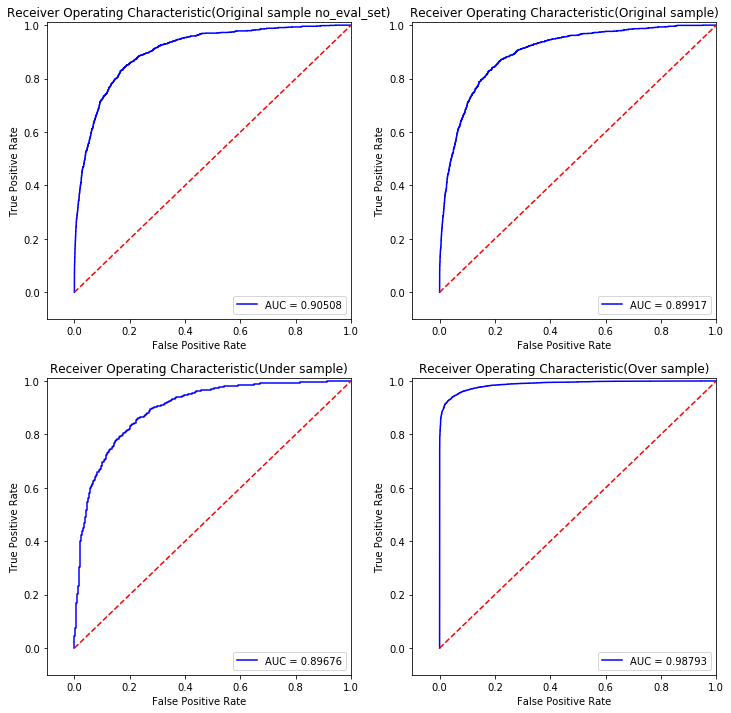

In [38]:
y_pred_prob_XGBC = model.predict_proba(X_test)[:, 1]  # 阈值默认值为0.5
y_pred_prob_XGBC_o = XGBC.predict_proba(X_test)[:, 1]
y_pred_prob_XGBC_u = XGBC_u.predict_proba(X_test_u)[:, 1]
y_pred_prob_XGBC_s = XGBC_s.predict_proba(X_test_s)[:, 1]

fpr_1, tpr_1, thresholds_1 = roc_curve(y_test,y_pred_prob_XGBC)
fpr_2, tpr_2, thresholds_2 = roc_curve(y_test,y_pred_prob_XGBC_o)
fpr_3, tpr_3, thresholds_3 = roc_curve(y_test_u,y_pred_prob_XGBC_u)
fpr_4, tpr_4, thresholds_4 = roc_curve(y_test_s,y_pred_prob_XGBC_s)

roc_auc_1 = auc(fpr_1,tpr_1)
roc_auc_2 = auc(fpr_2,tpr_2)
roc_auc_3 = auc(fpr_3,tpr_3)
roc_auc_4 = auc(fpr_4,tpr_4)

# 繪ROC曲線
fig = pl.figure(figsize=(12,12))

pl.subplot(2, 2, 1)
plt.title('Receiver Operating Characteristic(Original sample no_eval_set)')
plt.plot(fpr_1, tpr_1, 'b',label='AUC = %0.5f'% roc_auc_1)
plt.legend(loc='lower right')
plt.plot([0,1],[0,1],'r--')
plt.xlim([-0.1,1.0])
plt.ylim([-0.1,1.01])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')

pl.subplot(2, 2, 2)
plt.title('Receiver Operating Characteristic(Original sample)')
plt.plot(fpr_2, tpr_2, 'b',label='AUC = %0.5f'% roc_auc_2)
plt.legend(loc='lower right')
plt.plot([0,1],[0,1],'r--')
plt.xlim([-0.1,1.0])
plt.ylim([-0.1,1.01])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')

pl.subplot(2, 2, 3)
plt.title('Receiver Operating Characteristic(Under sample)')
plt.plot(fpr_3, tpr_3, 'b',label='AUC = %0.5f'% roc_auc_3)
plt.legend(loc='lower right')
plt.plot([0,1],[0,1],'r--')
plt.xlim([-0.1,1.0])
plt.ylim([-0.1,1.01])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')

pl.subplot(2, 2, 4)
plt.title('Receiver Operating Characteristic(Over sample)')
plt.plot(fpr_4, tpr_4, 'b',label='AUC = %0.5f'% roc_auc_4)
plt.legend(loc='lower right')
plt.plot([0,1],[0,1],'r--')
plt.xlim([-0.1,1.0])
plt.ylim([-0.1,1.01])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')

plt.show()

### Feature importance可視化

Text(0.5,0,'Relative Importance')

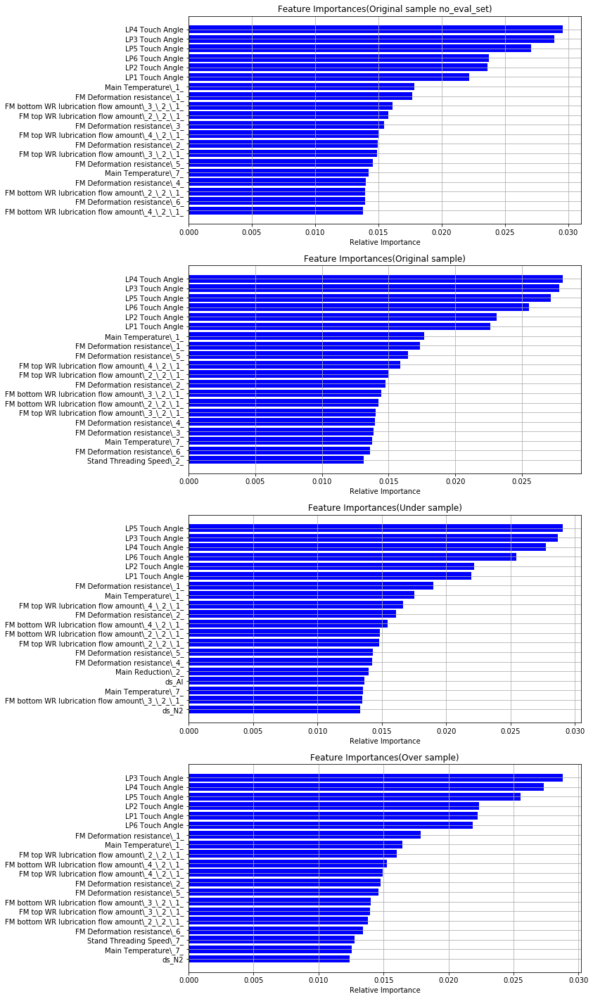

In [39]:
feat_names =  trainA75F.columns
importances_model = model.feature_importances_
importances_XGBC = XGBC.feature_importances_
importances_XGBC_u = XGBC_u.feature_importances_
importances_XGBC_s = XGBC_s.feature_importances_
indices_1 = np.argsort(importances_model) #.argsort數值由小到大排列
indices_2 = np.argsort(importances_XGBC)
indices_3 = np.argsort(importances_XGBC_u)
indices_4 = np.argsort(importances_XGBC_s)

plt.figure(figsize=(10,25))

pl.subplot(4, 1, 1)
plt.grid()
plt.title('Feature Importances(Original sample no_eval_set)')
plt.barh(range(len(indices_1[-20:])), importances_model[indices_1[-20:]], color='b', align='center')
plt.yticks(range(len(indices_1[-20:])), feat_names[indices_1[-20:]])
plt.xlabel('Relative Importance')

pl.subplot(4, 1, 2)
plt.grid()
plt.title('Feature Importances(Original sample)')
plt.barh(range(len(indices_2[-20:])), importances_XGBC[indices_2[-20:]], color='b', align='center')
plt.yticks(range(len(indices_2[-20:])), feat_names[indices_2[-20:]])
plt.xlabel('Relative Importance')

pl.subplot(4, 1, 3)
plt.grid()
plt.title('Feature Importances(Under sample)')
plt.barh(range(len(indices_3[-20:])), importances_XGBC_u[indices_3[-20:]], color='b', align='center')
plt.yticks(range(len(indices_3[-20:])), feat_names[indices_3[-20:]])
plt.xlabel('Relative Importance')

pl.subplot(4, 1, 4)
plt.grid()
plt.title('Feature Importances(Over sample)')
plt.barh(range(len(indices_4[-20:])), importances_XGBC_s[indices_4[-20:]], color='b', align='center')
plt.yticks(range(len(indices_4[-20:])), feat_names[indices_4[-20:]])
plt.xlabel('Relative Importance')

### Random Forest

In [40]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
# from sklearn.grid_search import GridSearchCV
# from sklearn import cross_validation, metrics

#Original sample
RFC = RandomForestClassifier(n_estimators = 1000 , random_state=42,
                             max_depth=20, min_samples_split=2) 
RFC.fit(X_train,y_train)
#Under sample
RFC_u = RandomForestClassifier(n_estimators = 1000 , random_state=42,
                               max_depth=20, min_samples_split=2) 
RFC_u.fit(X_train_u,y_train_u)
#Over sample
RFC_s = RandomForestClassifier(n_estimators = 1000 , random_state=42,
                               max_depth=20, min_samples_split=2) 
RFC_s.fit(X_train_s, y_train_s)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=20, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=1000, n_jobs=None,
            oob_score=False, random_state=42, verbose=0, warm_start=False)

In [41]:
#Original sample
predicted_RFC = RFC.predict(X_test) # 透過分類器產生預測结果
print("Test set accuracy score(Original sample): {:.5f}".format(accuracy_score(predicted_RFC, y_test)))
#Under sample
predicted_RFC_u = RFC_u.predict(X_test_u) # 透過分類器產生預測结果
print("Test set accuracy score(Under sample): {:.5f}".format(accuracy_score(predicted_RFC, y_test)))
#Over sample
predicted_RFC_s = RFC_s.predict(X_test_s) # 透過分類器產生預測结果
print("Test set accuracy score(Over sample): {:.5f}".format(accuracy_score(predicted_RFC_s, y_test_s)))

Test set accuracy score(Original sample): 0.88737
Test set accuracy score(Under sample): 0.88737
Test set accuracy score(Over sample): 0.94632


### 混淆矩陣可視化

Recall metric in the Original sample dataset:  0.27385892116182575
Recall metric in the under sample dataset:  0.7898305084745763
Recall metric in the over sample dataset:  0.9352104975396391


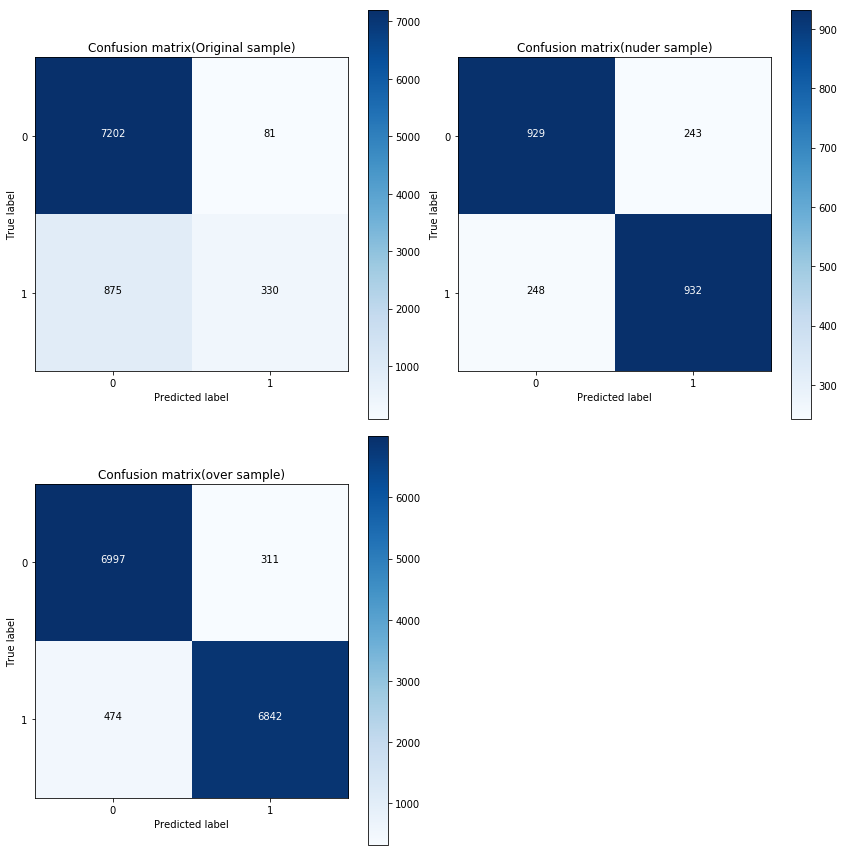

In [42]:
fig = pl.figure(figsize=(12,12))

# Compute confusion matrix
cnf_matrix_1 = confusion_matrix(y_test, predicted_RFC)
cnf_matrix_2 = confusion_matrix(y_test_u, predicted_RFC_u)
cnf_matrix_3 = confusion_matrix(y_test_s, predicted_RFC_s)
np.set_printoptions(precision=2) #設定輸出精度

# Plot non-normalized confusion matrix
class_names = [0,1]
pl.subplot(2, 2, 1)
print("Recall metric in the Original sample dataset: ", cnf_matrix_1[1,1]/(cnf_matrix_1[1,0]+cnf_matrix_1[1,1]))
plot_confusion_matrix(cnf_matrix_1
                      , classes=class_names
                      , title='Confusion matrix(Original sample)')
pl.subplot(2, 2, 2)
print("Recall metric in the under sample dataset: ", cnf_matrix_2[1,1]/(cnf_matrix_2[1,0]+cnf_matrix_2[1,1]))
plot_confusion_matrix(cnf_matrix_2
                      , classes=class_names
                      , title='Confusion matrix(nuder sample)')
pl.subplot(2, 2, 3)
print("Recall metric in the over sample dataset: ", cnf_matrix_3[1,1]/(cnf_matrix_3[1,0]+cnf_matrix_3[1,1]))
plot_confusion_matrix(cnf_matrix_3
                      , classes=class_names
                      , title='Confusion matrix(over sample)')

plt.show()

### ROC曲線

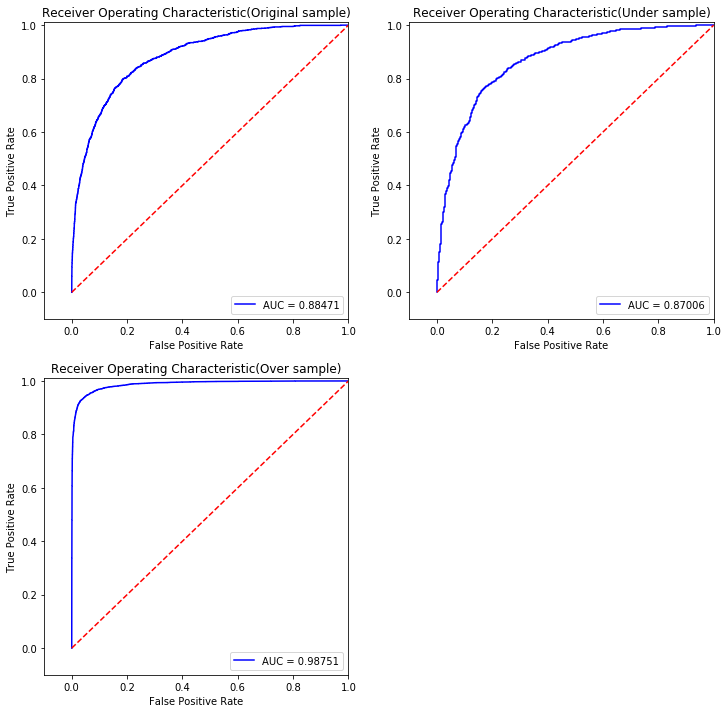

In [43]:
y_pred_prob_RFC = RFC.predict_proba(X_test)[:, 1]  # 阈值默认值为0.5
y_pred_prob_RFC_u = RFC_u.predict_proba(X_test_u)[:, 1]
y_pred_prob_RFC_s = RFC_s.predict_proba(X_test_s)[:, 1]

fpr_1, tpr_1, thresholds_1 = roc_curve(y_test,y_pred_prob_RFC)
fpr_2, tpr_2, thresholds_2 = roc_curve(y_test_u,y_pred_prob_RFC_u)
fpr_3, tpr_3, thresholds_3 = roc_curve(y_test_s,y_pred_prob_RFC_s)

roc_auc_1 = auc(fpr_1,tpr_1)
roc_auc_2 = auc(fpr_2,tpr_2)
roc_auc_3 = auc(fpr_3,tpr_3)

# 繪ROC曲線
fig = pl.figure(figsize=(12,12))

pl.subplot(2, 2, 1)
plt.title('Receiver Operating Characteristic(Original sample)')
plt.plot(fpr_1, tpr_1, 'b',label='AUC = %0.5f'% roc_auc_1)
plt.legend(loc='lower right')
plt.plot([0,1],[0,1],'r--')
plt.xlim([-0.1,1.0])
plt.ylim([-0.1,1.01])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')

pl.subplot(2, 2, 2)
plt.title('Receiver Operating Characteristic(Under sample)')
plt.plot(fpr_2, tpr_2, 'b',label='AUC = %0.5f'% roc_auc_2)
plt.legend(loc='lower right')
plt.plot([0,1],[0,1],'r--')
plt.xlim([-0.1,1.0])
plt.ylim([-0.1,1.01])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')

pl.subplot(2, 2, 3)
plt.title('Receiver Operating Characteristic(Over sample)')
plt.plot(fpr_3, tpr_3, 'b',label='AUC = %0.5f'% roc_auc_3)
plt.legend(loc='lower right')
plt.plot([0,1],[0,1],'r--')
plt.xlim([-0.1,1.0])
plt.ylim([-0.1,1.01])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')

plt.show()

### Feature importance可視化

Text(0.5,0,'Relative Importance')

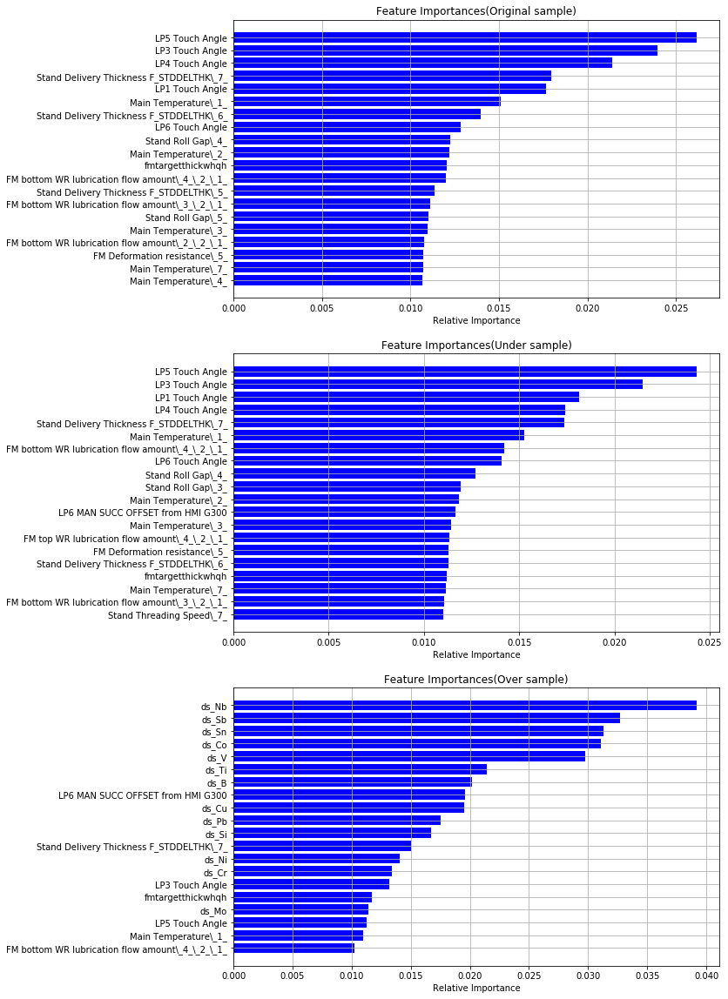

In [44]:
feat_names =  trainA75F.columns
importances_RFC = RFC.feature_importances_
importances_RFC_u = RFC_u.feature_importances_
importances_RFC_s = RFC_s.feature_importances_

indices_1 = np.argsort(importances_RFC) #.argsort數值由小到大排列
indices_2 = np.argsort(importances_RFC_u)
indices_3 = np.argsort(importances_RFC_s)

plt.figure(figsize=(10,20))

pl.subplot(3, 1, 1)
plt.grid()
plt.title('Feature Importances(Original sample)')
plt.barh(range(len(indices_1[-20:])), importances_RFC[indices_1[-20:]], color='b', align='center')
plt.yticks(range(len(indices_1[-20:])), feat_names[indices_1[-20:]])
plt.xlabel('Relative Importance')

pl.subplot(3, 1, 2)
plt.grid()
plt.title('Feature Importances(Under sample)')
plt.barh(range(len(indices_2[-20:])), importances_RFC_u[indices_2[-20:]], color='b', align='center')
plt.yticks(range(len(indices_2[-20:])), feat_names[indices_2[-20:]])
plt.xlabel('Relative Importance')

pl.subplot(3, 1, 3)
plt.grid()
plt.title('Feature Importances(Over sample)')
plt.barh(range(len(indices_3[-20:])), importances_RFC_s[indices_3[-20:]], color='b', align='center')
plt.yticks(range(len(indices_3[-20:])), feat_names[indices_3[-20:]])
plt.xlabel('Relative Importance')

### Decision tree

In [45]:
from sklearn.tree import DecisionTreeClassifier

#Original sample
clf = DecisionTreeClassifier(max_depth=20,random_state=42)
clf.fit(X_train, y_train)

#Under sample
clf_u = DecisionTreeClassifier(max_depth=20,random_state=42)
clf_u.fit(X_train_u, y_train_u)

#Over sample
clf_s = DecisionTreeClassifier(max_depth=20,random_state=42)
clf_s.fit(X_train_s, y_train_s)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=20,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=42,
            splitter='best')

In [46]:
#Original sample
predicted_clf = clf.predict(X_test) # 透過分類器產生預測结果
print("Test set accuracy score(Original sample): {:.5f}".format(accuracy_score(predicted_clf, y_test)))
#Under sample
predicted_clf_u = clf_u.predict(X_test_u) # 透過分類器產生預測结果
print("Test set accuracy score(Under sample): {:.5f}".format(accuracy_score(predicted_clf, y_test)))
#Over sample
predicted_clf_s = clf_s.predict(X_test_s) # 透過分類器產生預測结果
print("Test set accuracy score(Over sample): {:.5f}".format(accuracy_score(predicted_clf_s, y_test_s)))

Test set accuracy score(Original sample): 0.85061
Test set accuracy score(Under sample): 0.85061
Test set accuracy score(Over sample): 0.88799


### 混淆矩陣

Recall metric in the Original sample dataset:  0.41161825726141077
Recall metric in the under sample dataset:  0.7008474576271186
Recall metric in the over sample dataset:  0.893521049753964


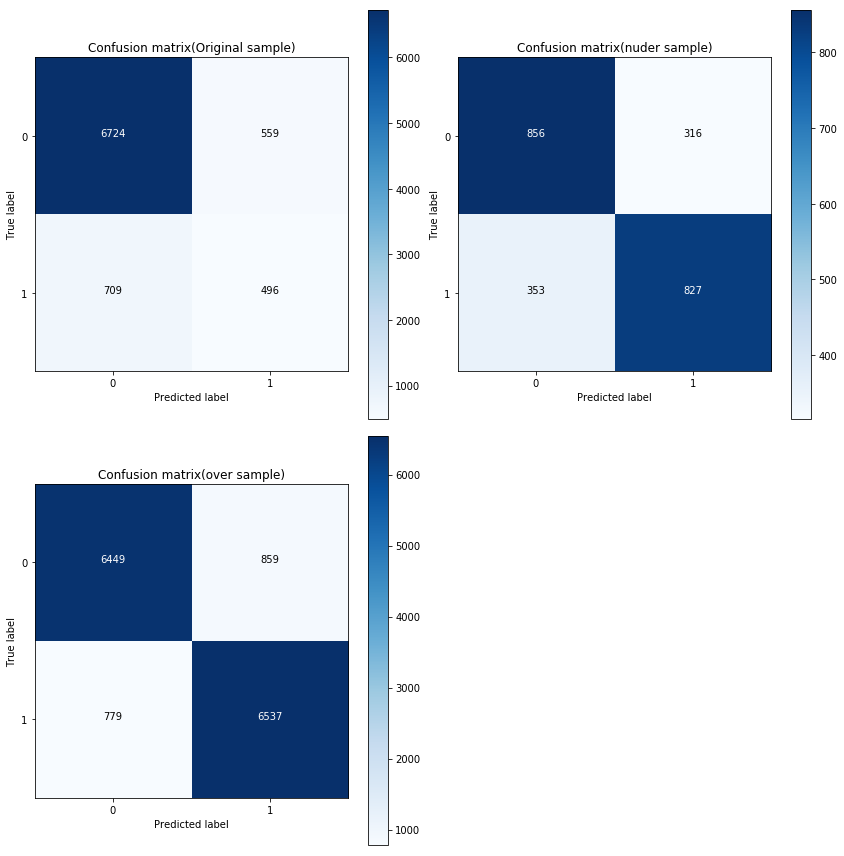

In [47]:
fig = pl.figure(figsize=(12,12))

# Compute confusion matrix
cnf_matrix_1 = confusion_matrix(y_test, predicted_clf)
cnf_matrix_2 = confusion_matrix(y_test_u, predicted_clf_u)
cnf_matrix_3 = confusion_matrix(y_test_s, predicted_clf_s)
np.set_printoptions(precision=2) #設定輸出精度

# Plot non-normalized confusion matrix
class_names = [0,1]
pl.subplot(2, 2, 1)
print("Recall metric in the Original sample dataset: ", cnf_matrix_1[1,1]/(cnf_matrix_1[1,0]+cnf_matrix_1[1,1]))
plot_confusion_matrix(cnf_matrix_1
                      , classes=class_names
                      , title='Confusion matrix(Original sample)')
pl.subplot(2, 2, 2)
print("Recall metric in the under sample dataset: ", cnf_matrix_2[1,1]/(cnf_matrix_2[1,0]+cnf_matrix_2[1,1]))
plot_confusion_matrix(cnf_matrix_2
                      , classes=class_names
                      , title='Confusion matrix(nuder sample)')
pl.subplot(2, 2, 3)
print("Recall metric in the over sample dataset: ", cnf_matrix_3[1,1]/(cnf_matrix_3[1,0]+cnf_matrix_3[1,1]))
plot_confusion_matrix(cnf_matrix_3
                      , classes=class_names
                      , title='Confusion matrix(over sample)')

plt.show()

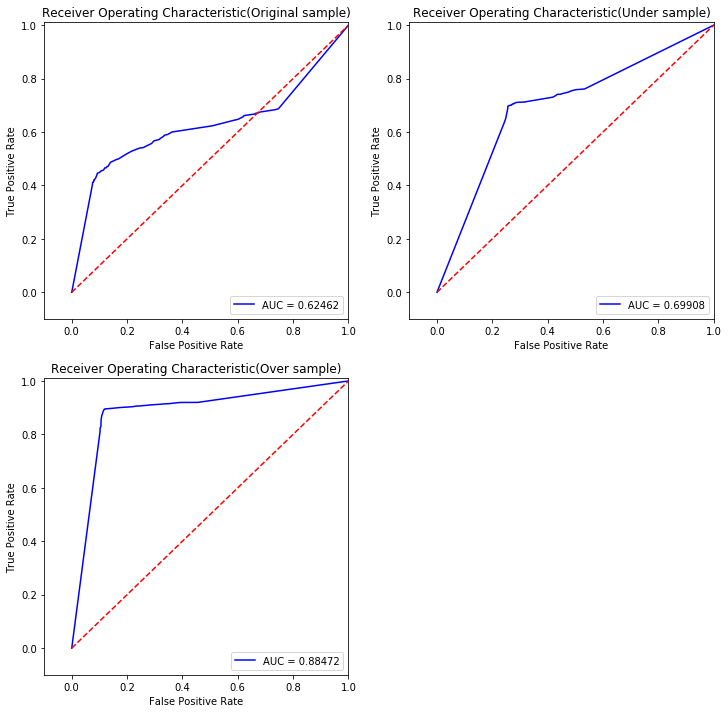

In [48]:
y_pred_prob_clf = clf.predict_proba(X_test)[:, 1]  # 阈值默认值为0.5
y_pred_prob_clf_u = clf_u.predict_proba(X_test_u)[:, 1]
y_pred_prob_clf_s = clf_s.predict_proba(X_test_s)[:, 1]

fpr_1, tpr_1, thresholds_1 = roc_curve(y_test,y_pred_prob_clf)
fpr_2, tpr_2, thresholds_2 = roc_curve(y_test_u,y_pred_prob_clf_u)
fpr_3, tpr_3, thresholds_3 = roc_curve(y_test_s,y_pred_prob_clf_s)

roc_auc_1 = auc(fpr_1,tpr_1)
roc_auc_2 = auc(fpr_2,tpr_2)
roc_auc_3 = auc(fpr_3,tpr_3)

# 繪ROC曲線
fig = pl.figure(figsize=(12,12))

pl.subplot(2, 2, 1)
plt.title('Receiver Operating Characteristic(Original sample)')
plt.plot(fpr_1, tpr_1, 'b',label='AUC = %0.5f'% roc_auc_1)
plt.legend(loc='lower right')
plt.plot([0,1],[0,1],'r--')
plt.xlim([-0.1,1.0])
plt.ylim([-0.1,1.01])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')

pl.subplot(2, 2, 2)
plt.title('Receiver Operating Characteristic(Under sample)')
plt.plot(fpr_2, tpr_2, 'b',label='AUC = %0.5f'% roc_auc_2)
plt.legend(loc='lower right')
plt.plot([0,1],[0,1],'r--')
plt.xlim([-0.1,1.0])
plt.ylim([-0.1,1.01])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')

pl.subplot(2, 2, 3)
plt.title('Receiver Operating Characteristic(Over sample)')
plt.plot(fpr_3, tpr_3, 'b',label='AUC = %0.5f'% roc_auc_3)
plt.legend(loc='lower right')
plt.plot([0,1],[0,1],'r--')
plt.xlim([-0.1,1.0])
plt.ylim([-0.1,1.01])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')

plt.show()

### Feature importance可視化

Text(0.5,0,'Relative Importance')

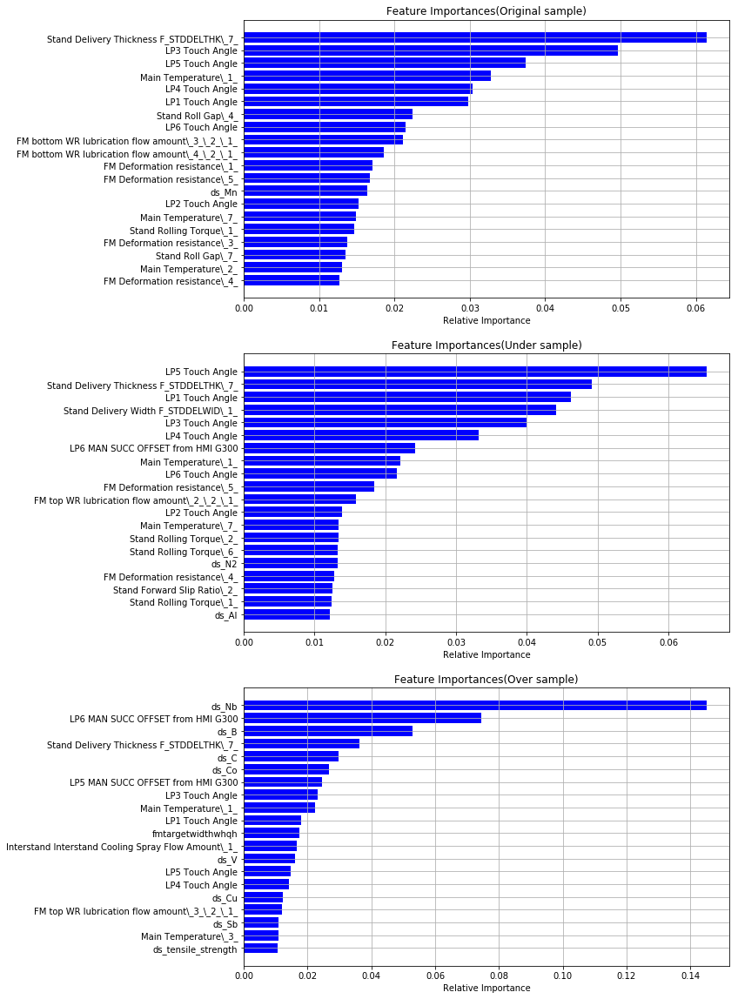

In [49]:
feat_names =  trainA75F.columns
importances_clf = clf.feature_importances_
importances_clf_u = clf_u.feature_importances_
importances_clf_s = clf_s.feature_importances_

indices_1 = np.argsort(importances_clf) #.argsort數值由小到大排列
indices_2 = np.argsort(importances_clf_u)
indices_3 = np.argsort(importances_clf_s)

plt.figure(figsize=(10,20))

pl.subplot(3, 1, 1)
plt.grid()
plt.title('Feature Importances(Original sample)')
plt.barh(range(len(indices_1[-20:])), importances_clf[indices_1[-20:]], color='b', align='center')
plt.yticks(range(len(indices_1[-20:])), feat_names[indices_1[-20:]])
plt.xlabel('Relative Importance')

pl.subplot(3, 1, 2)
plt.grid()
plt.title('Feature Importances(Under sample)')
plt.barh(range(len(indices_2[-20:])), importances_clf_u[indices_2[-20:]], color='b', align='center')
plt.yticks(range(len(indices_2[-20:])), feat_names[indices_2[-20:]])
plt.xlabel('Relative Importance')

pl.subplot(3, 1, 3)
plt.grid()
plt.title('Feature Importances(Over sample)')
plt.barh(range(len(indices_3[-20:])), importances_clf_s[indices_3[-20:]], color='b', align='center')
plt.yticks(range(len(indices_3[-20:])), feat_names[indices_3[-20:]])
plt.xlabel('Relative Importance')

In [50]:
# !pip install graphviz

In [51]:
# import graphviz
# from sklearn.tree import export_graphviz
# dot_data = export_graphviz(clf_s, out_file=None) 
# graph = graphviz.Source(dot_data) 
# dot_data = export_graphviz(clf_s, out_file=None, 
#                          feature_names=trainA75F.columns,  
#                          class_names=trainA75F.columns,  
#                          filled=True, rounded=True,  
#                          special_characters=True)  
# graph = graphviz.Source(dot_data) 
# graph

### GradientBoosting

In [52]:
from sklearn.ensemble import GradientBoostingClassifier

#Original sample
gbc = GradientBoostingClassifier()
gbc.fit(X_train, y_train)

#Under sample
gbc_u = GradientBoostingClassifier()
gbc_u.fit(X_train_u, y_train_u)

#Over sample
gbc_s = GradientBoostingClassifier()
gbc_s.fit(X_train_s, y_train_s)

GradientBoostingClassifier(criterion='friedman_mse', init=None,
              learning_rate=0.1, loss='deviance', max_depth=3,
              max_features=None, max_leaf_nodes=None,
              min_impurity_decrease=0.0, min_impurity_split=None,
              min_samples_leaf=1, min_samples_split=2,
              min_weight_fraction_leaf=0.0, n_estimators=100,
              n_iter_no_change=None, presort='auto', random_state=None,
              subsample=1.0, tol=0.0001, validation_fraction=0.1,
              verbose=0, warm_start=False)

In [53]:
#Original sample
predicted_gbc = gbc.predict(X_test) # 透過分類器產生預測结果
print("Test set accuracy score(Original sample): {:.5f}".format(accuracy_score(predicted_gbc, y_test)))
#Under sample
predicted_gbc_u = gbc_u.predict(X_test_u) # 透過分類器產生預測结果
print("Test set accuracy score(Under sample): {:.5f}".format(accuracy_score(predicted_gbc, y_test)))
#Over sample
predicted_gbc_s = gbc_s.predict(X_test_s) # 透過分類器產生預測结果
print("Test set accuracy score(Over sample): {:.5f}".format(accuracy_score(predicted_gbc_s, y_test_s)))

Test set accuracy score(Original sample): 0.87418
Test set accuracy score(Under sample): 0.87418
Test set accuracy score(Over sample): 0.90379


### 混淆矩陣

Recall metric in the Original sample dataset:  0.16680497925311202
Recall metric in the under sample dataset:  0.7813559322033898
Recall metric in the over sample dataset:  0.8419901585565883


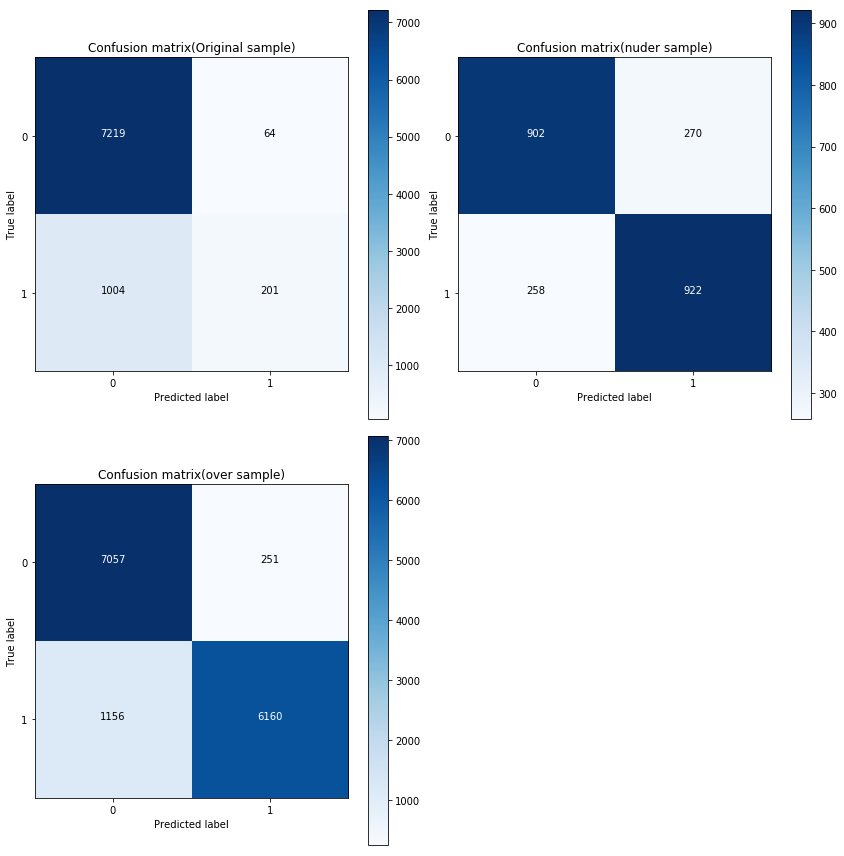

In [54]:
fig = pl.figure(figsize=(12,12))

# Compute confusion matrix
cnf_matrix_1 = confusion_matrix(y_test, predicted_gbc)
cnf_matrix_2 = confusion_matrix(y_test_u, predicted_gbc_u)
cnf_matrix_3 = confusion_matrix(y_test_s, predicted_gbc_s)
np.set_printoptions(precision=2) #設定輸出精度

# Plot non-normalized confusion matrix
class_names = [0,1]
pl.subplot(2, 2, 1)
print("Recall metric in the Original sample dataset: ", cnf_matrix_1[1,1]/(cnf_matrix_1[1,0]+cnf_matrix_1[1,1]))
plot_confusion_matrix(cnf_matrix_1
                      , classes=class_names
                      , title='Confusion matrix(Original sample)')
pl.subplot(2, 2, 2)
print("Recall metric in the under sample dataset: ", cnf_matrix_2[1,1]/(cnf_matrix_2[1,0]+cnf_matrix_2[1,1]))
plot_confusion_matrix(cnf_matrix_2
                      , classes=class_names
                      , title='Confusion matrix(nuder sample)')
pl.subplot(2, 2, 3)
print("Recall metric in the over sample dataset: ", cnf_matrix_3[1,1]/(cnf_matrix_3[1,0]+cnf_matrix_3[1,1]))
plot_confusion_matrix(cnf_matrix_3
                      , classes=class_names
                      , title='Confusion matrix(over sample)')

plt.show()

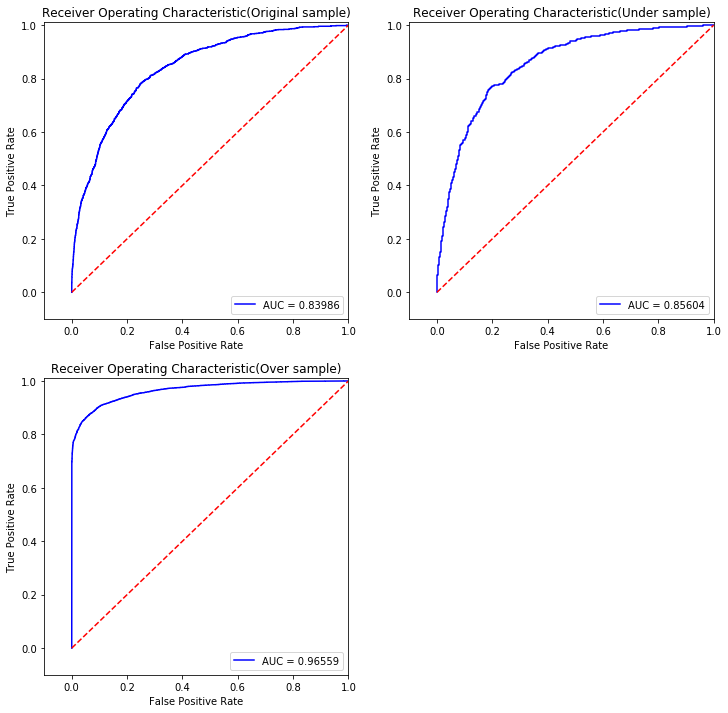

In [55]:
y_pred_prob_gbc = gbc.predict_proba(X_test)[:, 1]  # 阈值默认值为0.5
y_pred_prob_gbc_u = gbc_u.predict_proba(X_test_u)[:, 1]
y_pred_prob_gbc_s = gbc_s.predict_proba(X_test_s)[:, 1]

fpr_1, tpr_1, thresholds_1 = roc_curve(y_test,y_pred_prob_gbc)
fpr_2, tpr_2, thresholds_2 = roc_curve(y_test_u,y_pred_prob_gbc_u)
fpr_3, tpr_3, thresholds_3 = roc_curve(y_test_s,y_pred_prob_gbc_s)

roc_auc_1 = auc(fpr_1,tpr_1)
roc_auc_2 = auc(fpr_2,tpr_2)
roc_auc_3 = auc(fpr_3,tpr_3)

# 繪ROC曲線
fig = pl.figure(figsize=(12,12))

pl.subplot(2, 2, 1)
plt.title('Receiver Operating Characteristic(Original sample)')
plt.plot(fpr_1, tpr_1, 'b',label='AUC = %0.5f'% roc_auc_1)
plt.legend(loc='lower right')
plt.plot([0,1],[0,1],'r--')
plt.xlim([-0.1,1.0])
plt.ylim([-0.1,1.01])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')

pl.subplot(2, 2, 2)
plt.title('Receiver Operating Characteristic(Under sample)')
plt.plot(fpr_2, tpr_2, 'b',label='AUC = %0.5f'% roc_auc_2)
plt.legend(loc='lower right')
plt.plot([0,1],[0,1],'r--')
plt.xlim([-0.1,1.0])
plt.ylim([-0.1,1.01])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')

pl.subplot(2, 2, 3)
plt.title('Receiver Operating Characteristic(Over sample)')
plt.plot(fpr_3, tpr_3, 'b',label='AUC = %0.5f'% roc_auc_3)
plt.legend(loc='lower right')
plt.plot([0,1],[0,1],'r--')
plt.xlim([-0.1,1.0])
plt.ylim([-0.1,1.01])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')

plt.show()

### Feature importance可視化

Text(0.5,0,'Relative Importance')

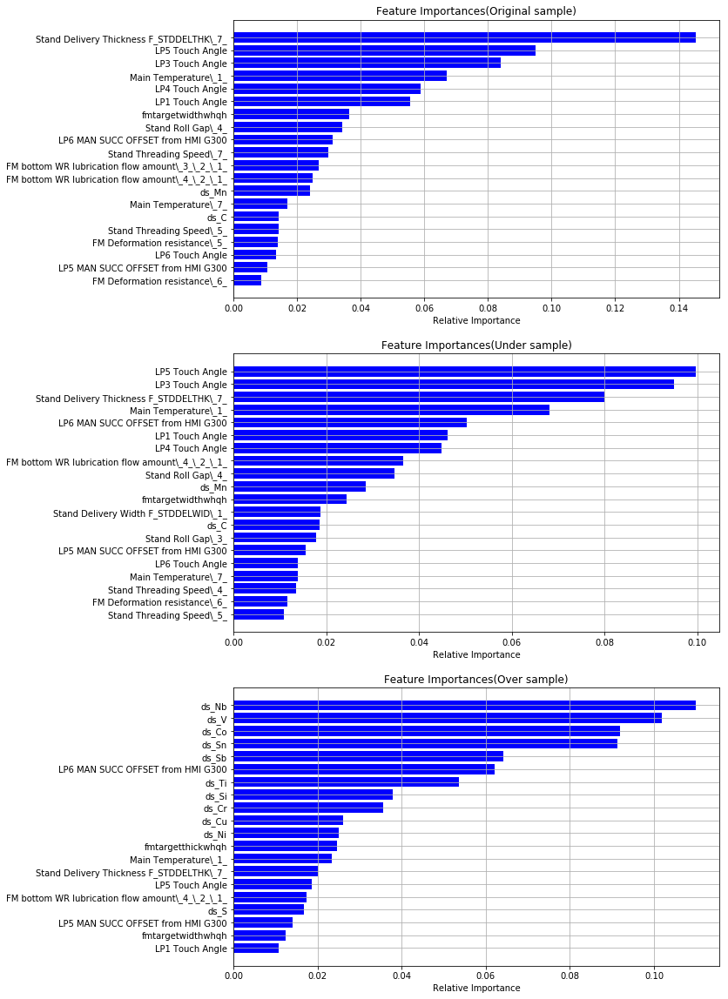

In [56]:
feat_names =  trainA75F.columns
importances_gbc = gbc.feature_importances_
importances_gbc_u = gbc_u.feature_importances_
importances_gbc_s = gbc_s.feature_importances_

indices_1 = np.argsort(importances_gbc) #.argsort數值由小到大排列
indices_2 = np.argsort(importances_gbc_u)
indices_3 = np.argsort(importances_gbc_s)

plt.figure(figsize=(10,20))

pl.subplot(3, 1, 1)
plt.grid()
plt.title('Feature Importances(Original sample)')
plt.barh(range(len(indices_1[-20:])), importances_gbc[indices_1[-20:]], color='b', align='center')
plt.yticks(range(len(indices_1[-20:])), feat_names[indices_1[-20:]])
plt.xlabel('Relative Importance')

pl.subplot(3, 1, 2)
plt.grid()
plt.title('Feature Importances(Under sample)')
plt.barh(range(len(indices_2[-20:])), importances_gbc_u[indices_2[-20:]], color='b', align='center')
plt.yticks(range(len(indices_2[-20:])), feat_names[indices_2[-20:]])
plt.xlabel('Relative Importance')

pl.subplot(3, 1, 3)
plt.grid()
plt.title('Feature Importances(Over sample)')
plt.barh(range(len(indices_3[-20:])), importances_gbc_s[indices_3[-20:]], color='b', align='center')
plt.yticks(range(len(indices_3[-20:])), feat_names[indices_3[-20:]])
plt.xlabel('Relative Importance')

### SVM

In [57]:
from sklearn import svm, datasets

#Original sample
svm = GradientBoostingClassifier()
svm.fit(X_train, y_train)

#Under sample
svm_u = GradientBoostingClassifier()
svm_u.fit(X_train_u, y_train_u)

#Over sample
svm_s = GradientBoostingClassifier()
svm_s.fit(X_train_s, y_train_s)

GradientBoostingClassifier(criterion='friedman_mse', init=None,
              learning_rate=0.1, loss='deviance', max_depth=3,
              max_features=None, max_leaf_nodes=None,
              min_impurity_decrease=0.0, min_impurity_split=None,
              min_samples_leaf=1, min_samples_split=2,
              min_weight_fraction_leaf=0.0, n_estimators=100,
              n_iter_no_change=None, presort='auto', random_state=None,
              subsample=1.0, tol=0.0001, validation_fraction=0.1,
              verbose=0, warm_start=False)

In [58]:
#Original sample
predicted_svm = svm.predict(X_test) # 透過分類器產生預測结果
print("Test set accuracy score(Original sample): {:.5f}".format(accuracy_score(predicted_gbc, y_test)))
#Under sample
predicted_svm_u = svm_u.predict(X_test_u) # 透過分類器產生預測结果
print("Test set accuracy score(Under sample): {:.5f}".format(accuracy_score(predicted_gbc, y_test)))
#Over sample
predicted_svm_s = svm_s.predict(X_test_s) # 透過分類器產生預測结果
print("Test set accuracy score(Over sample): {:.5f}".format(accuracy_score(predicted_gbc_s, y_test_s)))

Test set accuracy score(Original sample): 0.87418
Test set accuracy score(Under sample): 0.87418
Test set accuracy score(Over sample): 0.90379


### 混淆矩陣

Recall metric in the Original sample dataset:  0.16680497925311202
Recall metric in the under sample dataset:  0.7813559322033898
Recall metric in the over sample dataset:  0.8419901585565883


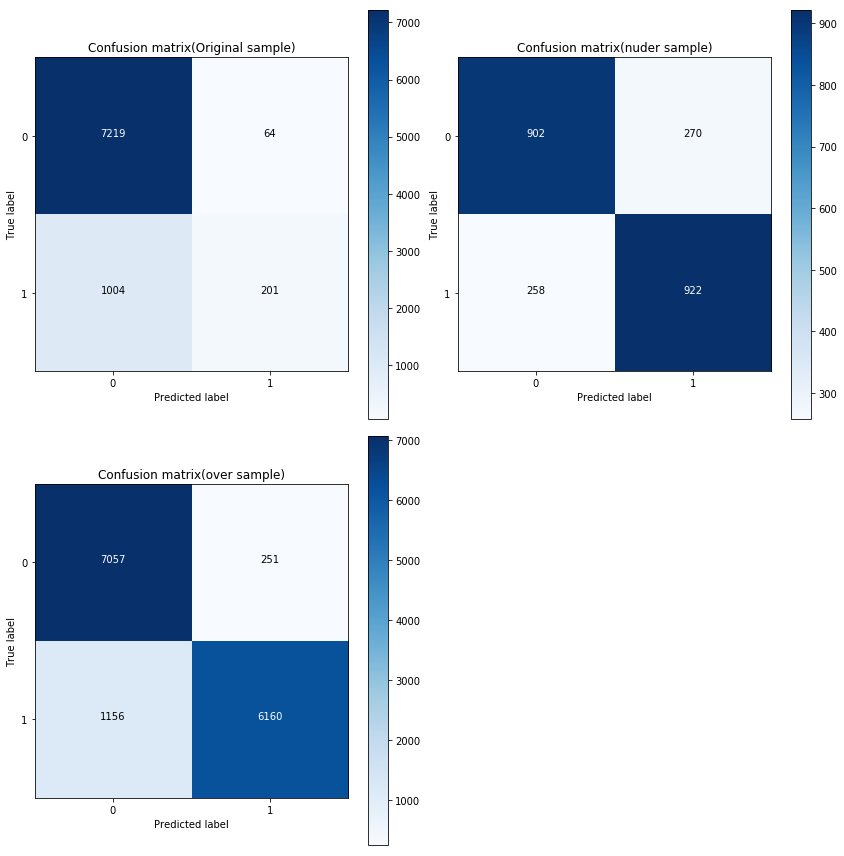

In [59]:
fig = pl.figure(figsize=(12,12))

# Compute confusion matrix
cnf_matrix_1 = confusion_matrix(y_test, predicted_svm)
cnf_matrix_2 = confusion_matrix(y_test_u, predicted_svm_u)
cnf_matrix_3 = confusion_matrix(y_test_s, predicted_svm_s)
np.set_printoptions(precision=2) #設定輸出精度

# Plot non-normalized confusion matrix
class_names = [0,1]
pl.subplot(2, 2, 1)
print("Recall metric in the Original sample dataset: ", cnf_matrix_1[1,1]/(cnf_matrix_1[1,0]+cnf_matrix_1[1,1]))
plot_confusion_matrix(cnf_matrix_1
                      , classes=class_names
                      , title='Confusion matrix(Original sample)')
pl.subplot(2, 2, 2)
print("Recall metric in the under sample dataset: ", cnf_matrix_2[1,1]/(cnf_matrix_2[1,0]+cnf_matrix_2[1,1]))
plot_confusion_matrix(cnf_matrix_2
                      , classes=class_names
                      , title='Confusion matrix(nuder sample)')
pl.subplot(2, 2, 3)
print("Recall metric in the over sample dataset: ", cnf_matrix_3[1,1]/(cnf_matrix_3[1,0]+cnf_matrix_3[1,1]))
plot_confusion_matrix(cnf_matrix_3
                      , classes=class_names
                      , title='Confusion matrix(over sample)')

plt.show()

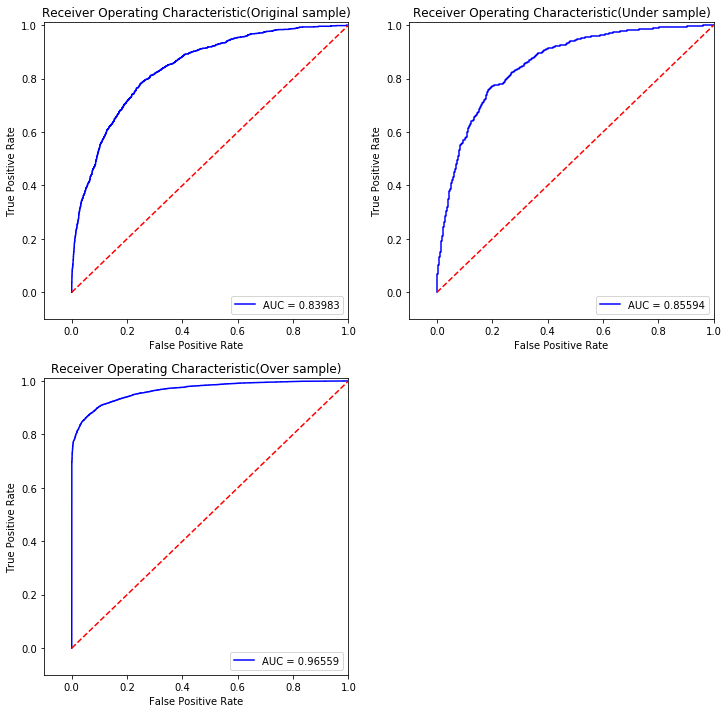

In [60]:
y_pred_prob_svm = svm.predict_proba(X_test)[:, 1]  # 阈值默认值为0.5
y_pred_prob_svm_u = svm_u.predict_proba(X_test_u)[:, 1]
y_pred_prob_svm_s = svm_s.predict_proba(X_test_s)[:, 1]

fpr_1, tpr_1, thresholds_1 = roc_curve(y_test,y_pred_prob_svm)
fpr_2, tpr_2, thresholds_2 = roc_curve(y_test_u,y_pred_prob_svm_u)
fpr_3, tpr_3, thresholds_3 = roc_curve(y_test_s,y_pred_prob_svm_s)

roc_auc_1 = auc(fpr_1,tpr_1)
roc_auc_2 = auc(fpr_2,tpr_2)
roc_auc_3 = auc(fpr_3,tpr_3)

# 繪ROC曲線
fig = pl.figure(figsize=(12,12))

pl.subplot(2, 2, 1)
plt.title('Receiver Operating Characteristic(Original sample)')
plt.plot(fpr_1, tpr_1, 'b',label='AUC = %0.5f'% roc_auc_1)
plt.legend(loc='lower right')
plt.plot([0,1],[0,1],'r--')
plt.xlim([-0.1,1.0])
plt.ylim([-0.1,1.01])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')

pl.subplot(2, 2, 2)
plt.title('Receiver Operating Characteristic(Under sample)')
plt.plot(fpr_2, tpr_2, 'b',label='AUC = %0.5f'% roc_auc_2)
plt.legend(loc='lower right')
plt.plot([0,1],[0,1],'r--')
plt.xlim([-0.1,1.0])
plt.ylim([-0.1,1.01])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')

pl.subplot(2, 2, 3)
plt.title('Receiver Operating Characteristic(Over sample)')
plt.plot(fpr_3, tpr_3, 'b',label='AUC = %0.5f'% roc_auc_3)
plt.legend(loc='lower right')
plt.plot([0,1],[0,1],'r--')
plt.xlim([-0.1,1.0])
plt.ylim([-0.1,1.01])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')

plt.show()

### Feature importance可視化

Text(0.5,0,'Relative Importance')

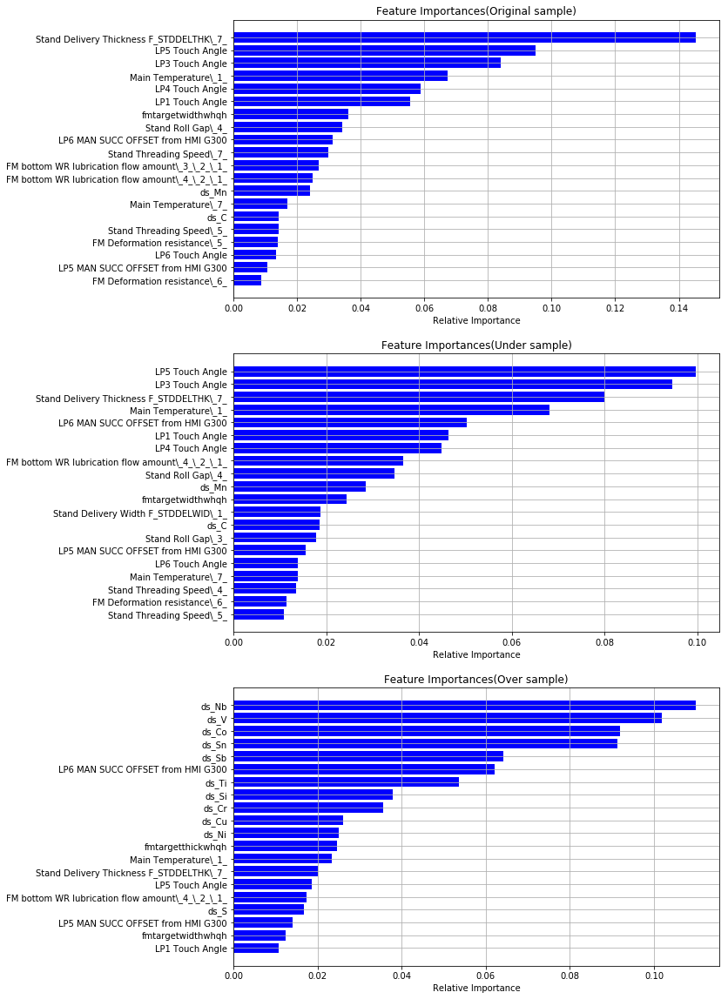

In [61]:
feat_names =  trainA75F.columns
importances_svm = svm.feature_importances_
importances_svm_u = svm_u.feature_importances_
importances_svm_s = svm_s.feature_importances_

indices_1 = np.argsort(importances_svm) #.argsort數值由小到大排列
indices_2 = np.argsort(importances_svm_u)
indices_3 = np.argsort(importances_svm_s)

plt.figure(figsize=(10,20))

pl.subplot(3, 1, 1)
plt.grid()
plt.title('Feature Importances(Original sample)')
plt.barh(range(len(indices_1[-20:])), importances_svm[indices_1[-20:]], color='b', align='center')
plt.yticks(range(len(indices_1[-20:])), feat_names[indices_1[-20:]])
plt.xlabel('Relative Importance')

pl.subplot(3, 1, 2)
plt.grid()
plt.title('Feature Importances(Under sample)')
plt.barh(range(len(indices_2[-20:])), importances_svm_u[indices_2[-20:]], color='b', align='center')
plt.yticks(range(len(indices_2[-20:])), feat_names[indices_2[-20:]])
plt.xlabel('Relative Importance')

pl.subplot(3, 1, 3)
plt.grid()
plt.title('Feature Importances(Over sample)')
plt.barh(range(len(indices_3[-20:])), importances_svm_s[indices_3[-20:]], color='b', align='center')
plt.yticks(range(len(indices_3[-20:])), feat_names[indices_3[-20:]])
plt.xlabel('Relative Importance')